# Import files

If you run this notebook on google colab you need to upload python scripts on the left panel.
To that end click on the left "Files" (or "Fichiers" in French) and drag and drop :
- python scripts from "Code" folder of github repository.
- csv files or xls files from "data" folder.
- Tensorflow model (files with .data or .index extensions) in the "Results" folder if you want to use neural network while avoiding the training step.
- csv files in "Results" folder if you want load Results presented in our paper.


In [1]:
import sys
formerPath = sys.path
sys.path.append('./code/')
sys.path.append('./BS/')

In [2]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
import sklearn as skl


import bootstrapping
import dataSetConstruction
import backtest
import BS
import loadData
import plotTools
import SSVI


from Bisect import bisect
from newton import newton
from BSImplVol import bsimpvol

import importlib

# Load data

In order to reproduce our paper experiments, execute cells from part "Load preformatted data". 

Each source of data produces the following objects : 
- bootstrap manages discounting and dividend.
- dataSet contains the training set.
- dataSetTest contains the testing set.
- $S0$ the spot value of the underlying 

#### DAX Data

For each day you need to load six csv files :
- *underlying.csv* for the stock value.
- *locvol.csv* for the local volatility calibrated with tree pricing and tikhonov volatility (see Crépey (2002)).
- *dividend.csv* for dividend extracted from put-call parity.
- *discount.csv* for zero-coupon curve. 
- *dataTrain.csv* for prices and/or implied volatility used in training set.
- *dataTest.csv* for prices and/or implied volatility used in testing set.
- "8_8_2001__filterdax.dat" for tikohnov local volatility.

In [3]:
workingFolder = "./data/09082001/"

Bootstrap discounting


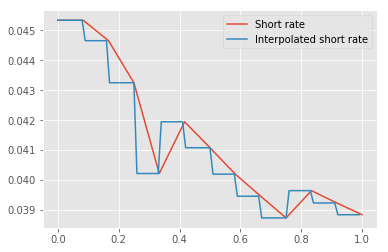

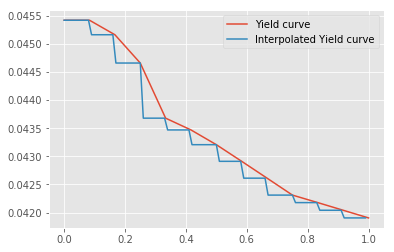

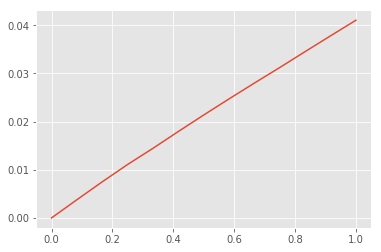

Bootstrap dividend


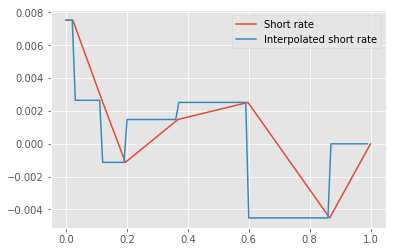

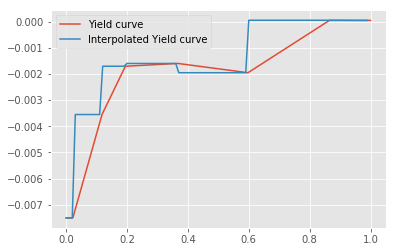

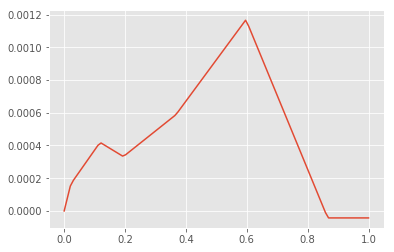

In [189]:
#Read csv files as dataFrames
trainingSet, testingSet, bootstrap, S0 = loadData.loadDataFromCSV(workingFolder,
                                                                  "9_8_2001__filterdax")

#### From Dat files (DAX data)
For a day x you must load :
- "x.dat.modelparam.dat"
- "x.dat.impliedvol.dat"
- "x.dat.calibr.out.dat"
- "x.dat"

Tikhonov PDE repricing error on training set :  2.4207935408017573
Bootstrap discounting


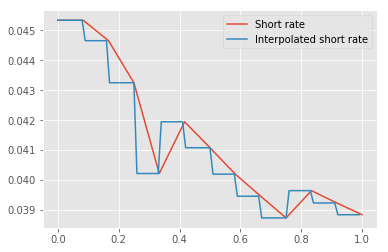

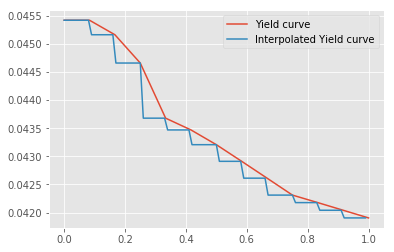

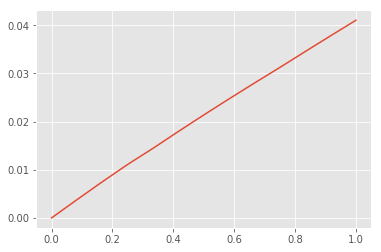

Bootstrap dividend


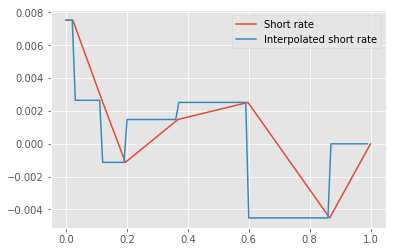

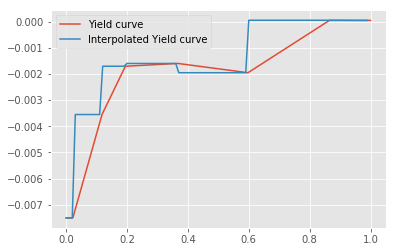

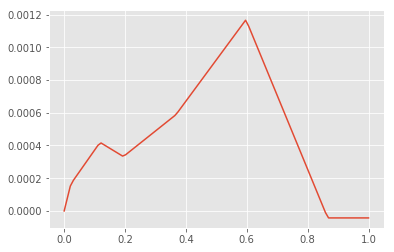

In [18]:
trainingSet, testingSet, bootstrap, S0 = loadData.loadDataFromDat(workingFolder,
                                                                  "9_8_2001__filterdax")

In [88]:
importlib.reload(loadData)

<module 'loadData' from './code/loadData.py'>

In [5]:
pd.options.mode.chained_assignment = 'raise'

#### SPX Data

File required : 
- yieldCurve.dat.
- Option_SPX_18_Mai_2019Feuille2.xlsm

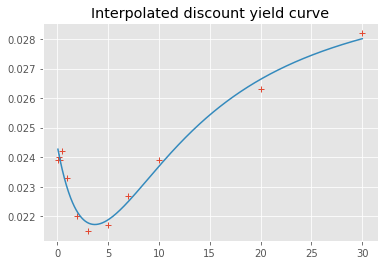

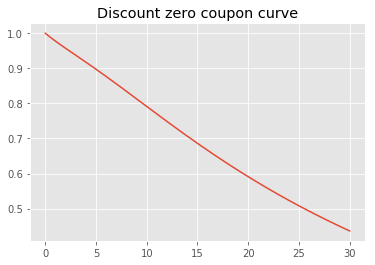

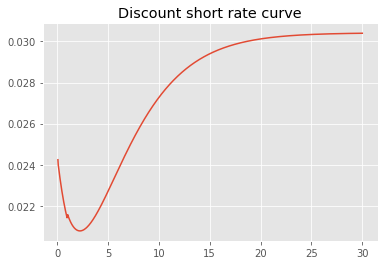

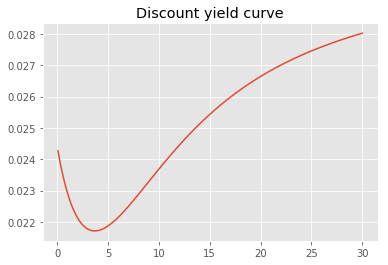

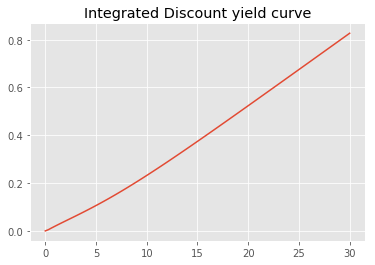

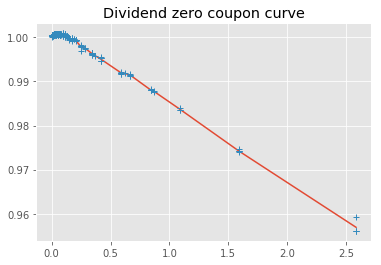

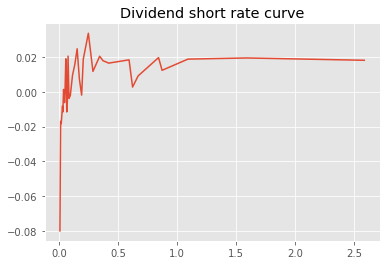

./code/bootstrapping.py:271: RuntimeWarning: invalid value encountered in double_scalars
  return (1 / x - 1) / float(t)


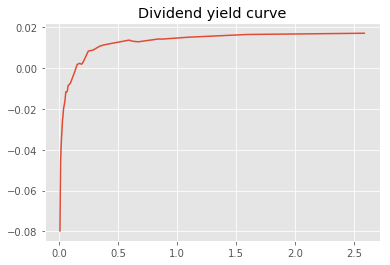

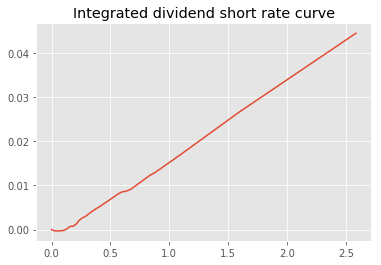

In [3]:
workingFolder = "./data/"
fileName = "Option_SPX_18_Mai_2019Feuille2.xlsm"
asOfDate = "2019-05-18"
trainingSet, testingSet, bootstrap, S0 = loadData.loadCBOTData(workingFolder, fileName, asOfDate)

In [8]:
importlib.reload(bootstrapping)

<module 'dataSetConstruction' from './code/dataSetConstruction.py'>

#### Load preformatted data

File required : 
- testingDataSet.csv
- trainingDataSet.csv
- dfCurve.csv

In [3]:
workingFolder = "./data/"
trainingSet, testingSet, bootstrap, S0 = loadData.loadFormattedData(workingFolder)

####  Eurostoxx data

File required : Data_EuroStoxx50_20190110_all_for_Marc.xlsx

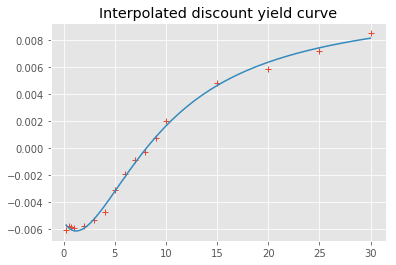

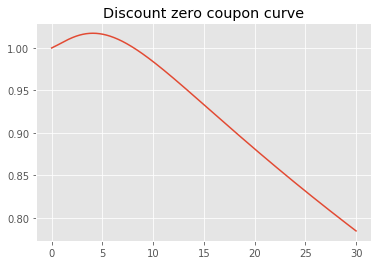

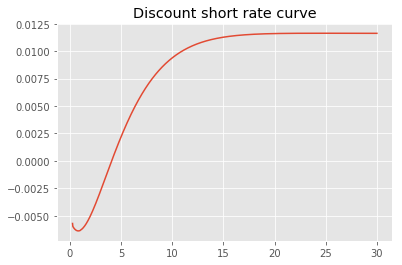

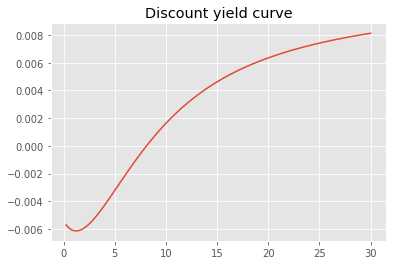

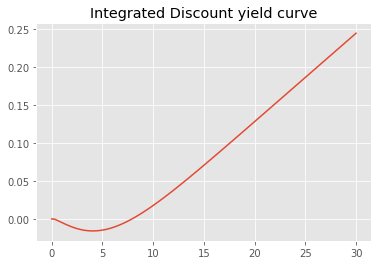

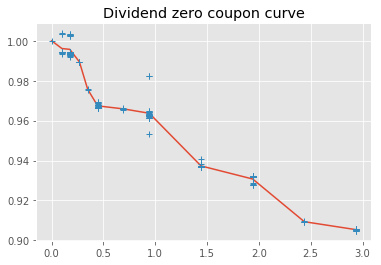

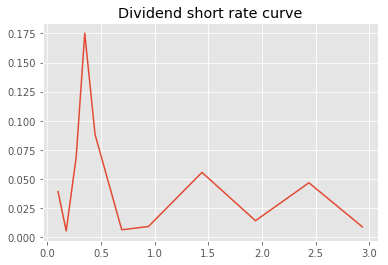

./code/bootstrapping.py:271: RuntimeWarning: invalid value encountered in double_scalars
  return (1 / x - 1) / float(t)


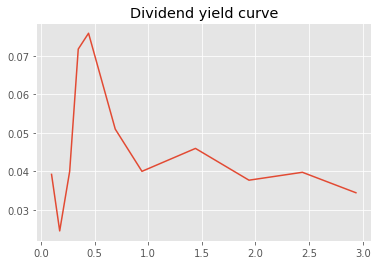

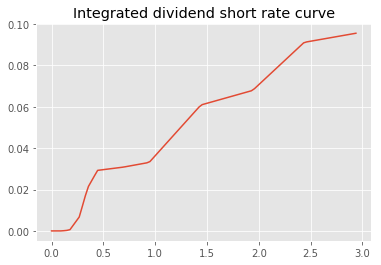

In [317]:
workingFolder = "./data/"
asOfDate = "2019-01-10"
filename = "Data_EuroStoxx50_20190110_all_for_Marc.xlsx"
trainingSet, testingSet, bootstrap, S0 = loadData.loadESXData(workingFolder, filename, asOfDate)

In [192]:
bootstrap.discountShortRate(10)

array(0.009402)

In [118]:
importlib.reload(loadData)

<module 'loadData' from './code/loadData.py'>

# Formatting data

### Boostsrapping Rate Curve

We assume a piecewise constant discount short rate $r$ and a piecewise constant dividend short rate $q$.

We estimate the "zero coupon dividend" $D(T) = e^{-\int_{0}^{T} q_s ds}$ by regressing it against maturity :
$$e^{-\int_{0}^{T} q_s ds} = \frac{C(T,K) - P(T,K) + K e^{-\int_{0}^{T} r_s ds}}{S_0}$$


Then we have $\hat{q}_t = - \frac{ \log{D(\overline{T})} - \log{D(\underline{T})} }{ \overline{T} - \underline{T} }$ with $\overline{T}$ the smallest discretized maturity greater than $T$ and $\underline{T}$ the grestest discretized maturity inferior than $T$.

bootstrap object has several members :
- **riskFreeIntegral** corresponds to $I_T = \int_{0}^{T} r_u du$.
- **riskFreeSpline**  corresponds to $r_u$ evaluated on a subgrid. Interpolated as step function from zero coupons
- **divSpreadIntegral** corresponds to $I_T = \int_{0}^{T} q_u du$, can be negative.
- **divSpline**  corresponds to $q_u$ evaluated on a subgrid, can be negative.

These curve should satisfy the call-put parity.

#### Change of variable

Neural network on modified prices with modified strike as input such that discounting and dividend don't intervene in Dupire formula calculation.


- In presence of dividend rate $d$ and risk free rate $r$ Dupire formula is :   $$\sigma^2(T,K) = 2 \frac{ \partial_T P(T,K) + (r-q) K \partial_K P(T,K) + qP(T,K)}{K² \partial_{K}^2 P(T,K)}$$ 
with Strike $K$, Maturity $T$, dividend rate $q$ and risk-free rate $r$, $P$ our pricing function. 
- We apply the following change of variable : $$ w(T,k) = \exp{(\int_{0}^{T} q_t dt)} P(T,K)$$ with $K = k \exp{(\int_{0}^{T} (r_t - q_t) dt)} $.
- Then Dupire equation becomes :  $\sigma^2(T,K) = 2 \frac{ \partial_T w(T,k)}{k² \partial_{k}^2 w(T,k)}$. 
- If we learn the mapping $v$ with a neural network then we obtain quickly by adjoint differentiation $\partial_T w$ and $\partial_{k²}^2 w$ and therefore $\sigma$.
- $k$ corresponds to "ChangedStrike" column.
- $\exp{(\int_{0}^{T} q_t dt)}$ corresponds to "DividendFactor" column.


In [1]:
#dataSetConstruction.checkCallPutParity(pd.concat([trainingSet, testingSet]), 
#                                       S0, 
#                                       bootstrap)

In [4]:
dataSet = trainingSet #Training set
dataSetTest = testingSet #Testing set
dataSet.head()

,,Price,Delta,Vega,Delta Strike,Gamma Strike,Theta,ChangedStrike,DividendFactor,Strike,Maturity,ImpliedVol,VegaRef,OptionType,logMoneyness,impliedTotalVariance
Strike,Maturity,,,,,,,,,,,,,,,
2200.0,0.419,9.95,-0.047968,184.678147,0.094049,-9.963916e-07,103.538454,2194.553900,0.994628,2200.0,0.419,0.2586,169.246997,-1.0,-0.264678,0.028020
2325.0,0.112,1.65,-0.015858,38.013410,0.027412,-3.969604e-05,73.268907,2323.142879,1.000111,2325.0,0.112,0.2958,15.762704,-1.0,-0.207736,0.009800
2400.0,0.093,1.60,-0.017779,38.199664,0.029753,-4.470370e-05,88.192154,2398.742294,1.000292,2400.0,0.093,0.2798,22.362901,-1.0,-0.175713,0.007281
2510.0,0.170,9.15,-0.074660,166.318158,0.128221,5.540400e-05,230.171845,2506.841932,0.999189,2510.0,0.170,0.2289,194.599716,-1.0,-0.131634,0.008907
2525.0,0.036,0.55,-0.010731,15.378146,0.016613,-5.456899e-05,87.679835,2524.212274,1.000312,2525.0,0.036,0.2893,6.408137,-1.0,-0.124728,0.003013


In [5]:
dataSetTest.head()

Price     Delta        Vega  Delta Strike  Gamma Strike  \
Strike Maturity                                                            
1700.0 0.246      0.80 -0.004171   17.445534      0.009788     -0.000018   
2300.0 0.419     14.30 -0.069169  246.251489      0.132054      0.000036   
2350.0 0.093      1.20 -0.013019   29.227795      0.022052     -0.000041   
       0.112      1.85 -0.018041   42.445051      0.030966     -0.000041   
2400.0 0.419     20.55 -0.099289  323.155078      0.185544      0.000106   

                      Theta  ChangedStrike  DividendFactor  Strike  Maturity  \
Strike Maturity                                                                
1700.0 0.246      15.329284    1697.643924        0.997527  1700.0     0.246   
2300.0 0.419     140.724773    2294.306350        0.994628  2300.0     0.419   
2350.0 0.093      66.591651    2348.768497        1.000292  2350.0     0.093   
       0.112      82.136307    2348.122910        1.000111  2350.0     0.112   
2400.0 0.419     187.583551    2394.058800        0.994628  2400.0     0.419   

                 ImpliedVol     VegaRef  OptionType  logMoneyness  \
Strike Maturity                                                     
1700.0 0.246         0.4147    0.062925        -1.0     -0.521416   
2300.0 0.419         0.2424  261.160274        -1.0     -0.220227   
2350.0 0.093         0.2959   11.271760        -1.0     -0.196766   
       0.112         0.2875   21.589857        -1.0     -0.197041   
2400.0 0.419         0.2264  368.610408        -1.0     -0.177667   

                 impliedTotalVariance  
Strike Maturity                        
1700.0 0.246                 0.042306  
2300.0 0.419                 0.024620  
2350.0 0.093                 0.008143  
       0.112                 0.009257  
2400.0 0.419                 0.021477

In [6]:
dfCurve = dataSetConstruction.savingData(bootstrap, 
                                         dataSet, 
                                         dataSetTest, 
                                         workingFolder)

Saving bootstrapping under dfCurve.csv
Saving training set under trainingDataSet.csv
Saving bootstrapping under testingDataSet.csv


In [7]:
threshold = pd.concat([dataSet, dataSetTest])["Price"].sort_values().iloc[int(0.05 * pd.concat([dataSet, dataSetTest]).shape[0])]
threshold

2.05

In [8]:
dataSet.shape

(135, 15)

In [9]:
dataSetTest.shape

(144, 15)

In [10]:
S0

2859.53

In [11]:
def getCall(df):
    return df[df["OptionType"]==1]
def getPut(df):
    return df[df["OptionType"]==-1]

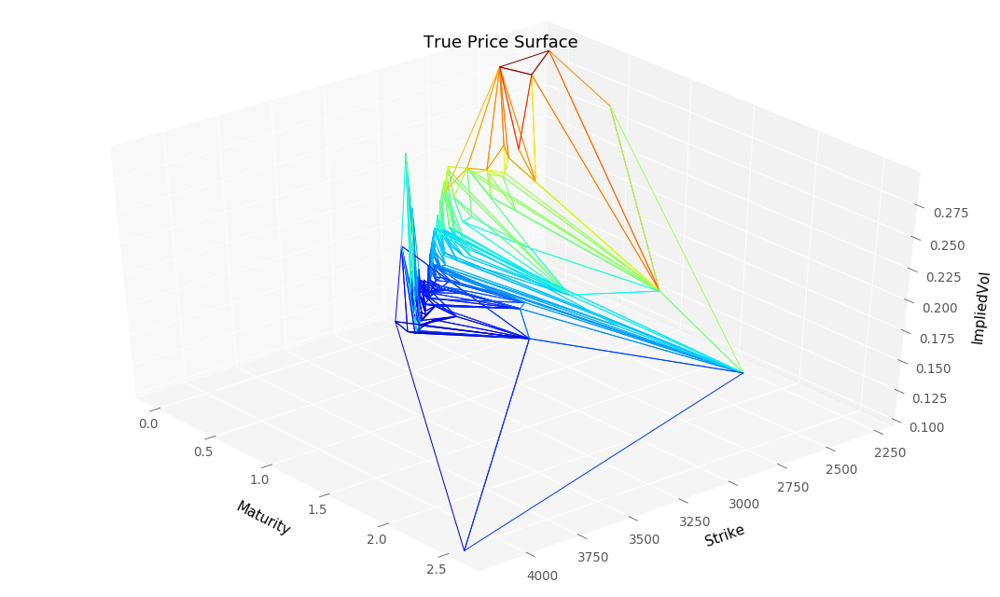

In [12]:
plotTools.plotSerie(getPut(trainingSet)["ImpliedVol"], 
                    yMin=0,
                    yMax=3*S0, 
                    Title = 'True Price Surface')

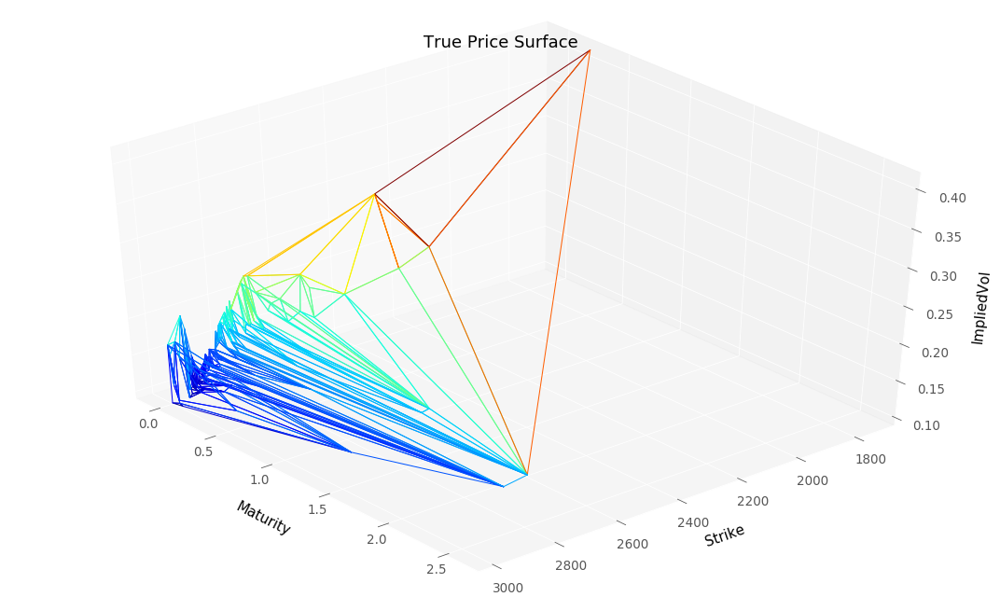

In [13]:
plotTools.plotSerie(getPut(testingSet)["ImpliedVol"], 
                    yMin=0,
                    yMax=3*S0, 
                    Title = 'True Price Surface')

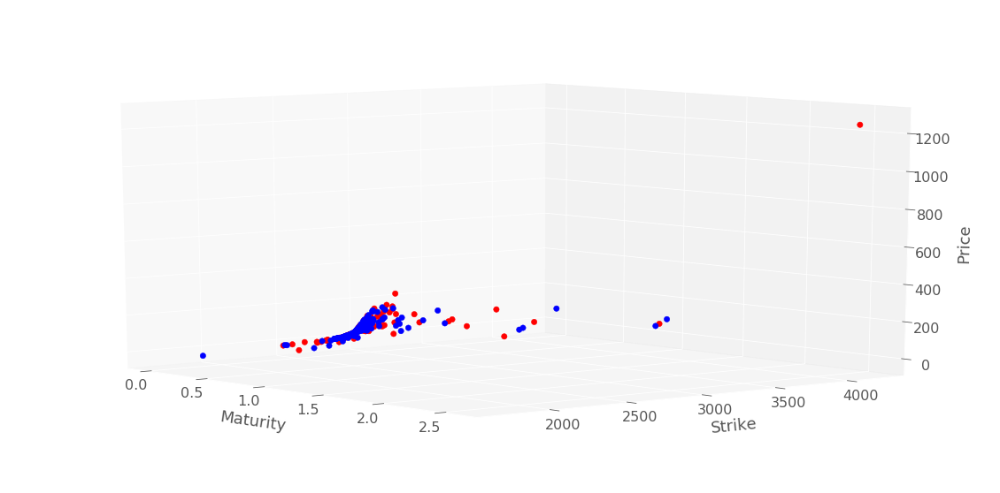

In [14]:
plotTools.plot2Series(getPut(testingSet)["Price"], 
                      getPut(trainingSet)["Price"], 
                      yMin=0,
                      yMax=3*S0, 
                      Title = 'True Price Surface')

## Scaling methods

Use min-max of scaling strike between 0 et 1 for improving stability of neural network training. 



In [15]:
activateScaling = False
transformCustom = dataSetConstruction.transformCustomMinMax if activateScaling else dataSetConstruction.transformCustomId
inverseTransform = dataSetConstruction.inverseTransformMinMax if activateScaling else dataSetConstruction.inverseTransformId
inverseTransformColumn = dataSetConstruction.inverseTransformColumnMinMax if activateScaling else dataSetConstruction.inverseTransformColumnId
inverseTransformColumnGreeks = dataSetConstruction.inverseTransformColumnGreeksMinMax if activateScaling else dataSetConstruction.inverseTransformColumnGreeksId

In [16]:
scaler = skl.preprocessing.MinMaxScaler(feature_range=(0, 1))
scaler.fit(dataSet)
scaledDataSet = transformCustom(dataSet, scaler)
scaledDataSetTest = transformCustom(dataSetTest, scaler)

In [17]:
scaledDataSet.head()

,,Price,Delta,Vega,Delta Strike,Gamma Strike,Theta,ChangedStrike,DividendFactor,Strike,Maturity,ImpliedVol,VegaRef,OptionType,logMoneyness,impliedTotalVariance
Strike,Maturity,,,,,,,,,,,,,,,
2200.0,0.419,9.95,-0.047968,184.678147,0.094049,-9.963916e-07,103.538454,2194.553900,0.994628,2200.0,0.419,0.2586,169.246997,-1.0,-0.264678,0.028020
2325.0,0.112,1.65,-0.015858,38.013410,0.027412,-3.969604e-05,73.268907,2323.142879,1.000111,2325.0,0.112,0.2958,15.762704,-1.0,-0.207736,0.009800
2400.0,0.093,1.60,-0.017779,38.199664,0.029753,-4.470370e-05,88.192154,2398.742294,1.000292,2400.0,0.093,0.2798,22.362901,-1.0,-0.175713,0.007281
2510.0,0.170,9.15,-0.074660,166.318158,0.128221,5.540400e-05,230.171845,2506.841932,0.999189,2510.0,0.170,0.2289,194.599716,-1.0,-0.131634,0.008907
2525.0,0.036,0.55,-0.010731,15.378146,0.016613,-5.456899e-05,87.679835,2524.212274,1.000312,2525.0,0.036,0.2893,6.408137,-1.0,-0.124728,0.003013


In [18]:
#Search strike for ATM option
midS0 = dataSet[dataSet.index.get_level_values("Strike") >= S0].index.get_level_values("Strike").min()

In [19]:
KMin = 0#0.7 * S0[0]
KMax = 2.0 * S0#1.3 * S0[0]


# SSVI Model

Implementation is inspired from Matlab code of Philipp Rindler : 
- Philipp Rindler (2020). Gatherals and Jacquier's Arbitrage-Free SVI Volatility Surfaces (https://www.mathworks.com/matlabcentral/fileexchange/49962-gatherals-and-jacquier-s-arbitrage-free-svi-volatility-surfaces), MATLAB Central File Exchange. Retrieved November 20, 2020.

In [20]:
import SSVI


In [21]:
np.seterr(all='warn')

{'divide': 'warn', 'over': 'warn', 'under': 'ignore', 'invalid': 'warn'}

In [22]:
importlib.reload(BS)

<module 'BS' from './code/BS.py'>

In [23]:
#parameters, theta, maturities, pSSVI = SSVI.train_svi_surface(dataSet, S0)
SSVIModel = SSVI.SSVIModel(S0, bootstrap)
SSVIModel.fit(dataSet)

Contrainte :  -0.7053266018149094
Parameters of SSVI model :  [-0.48289288  0.87307277  0.5       ]
time step 25  :  2.585
Contrainte :  0.20870100604518027
time step 24  :  1.588


./code/SSVI.py:617: RuntimeWarning: invalid value encountered in sqrt
  alpha = np.sign(beta) * np.sqrt(1 / beta ** 2 - 1)
./code/SSVI.py:619: RuntimeWarning: invalid value encountered in sqrt
  (b * (-rho + np.sign(alpha) * np.sqrt(1 + alpha ** 2) - alpha * np.sqrt(1 - rho ** 2))))
./code/SSVI.py:630: RuntimeWarning: invalid value encountered in sqrt
  a = vt * tau - b * sigma * np.sqrt(1 - rho ** 2)
./code/SSVI.py:324: RuntimeWarning: invalid value encountered in less
  if any(model_total_implied_variance < before_total_implied_variance) :
./code/SSVI.py:331: RuntimeWarning: invalid value encountered in greater
  if any(model_total_implied_variance > after_total_implied_variance) :


Contrainte :  0.21938730026256364
time step 23  :  1.09
Contrainte :  0.0381200551702906
time step 22  :  0.841
Contrainte :  0.22243909195283862
time step 21  :  0.591
Contrainte :  0.2218836147407982
time step 20  :  0.419
Contrainte :  0.22460316231891336
time step 19  :  0.342
Contrainte :  0.2123804327784234
time step 18  :  0.285
Contrainte :  0.2250437771965494
time step 17  :  0.24600000000000002
Contrainte :  0.22507852749189033
time step 16  :  0.203
Contrainte :  0.22384137207509708
time step 15  :  0.18899999999999997
Contrainte :  0.22529091996385886
time step 14  :  0.17
Contrainte :  0.22526910650958826
time step 13  :  0.151
Contrainte :  0.2233428634072273
time step 12  :  0.131
Contrainte :  0.2213463936852697
time step 11  :  0.11199999999999999
Contrainte :  0.2253609723983363
time step 10  :  0.09300000000000001
Contrainte :  0.20834454083286574
time step 9  :  0.07400000000000001
Contrainte :  0.16391143540492736
time step 8  :  0.063
Contrainte :  0.2209247515209

In [24]:
serie = SSVIModel.eval(dataSetTest)
serieTrain = SSVIModel.eval(dataSet)

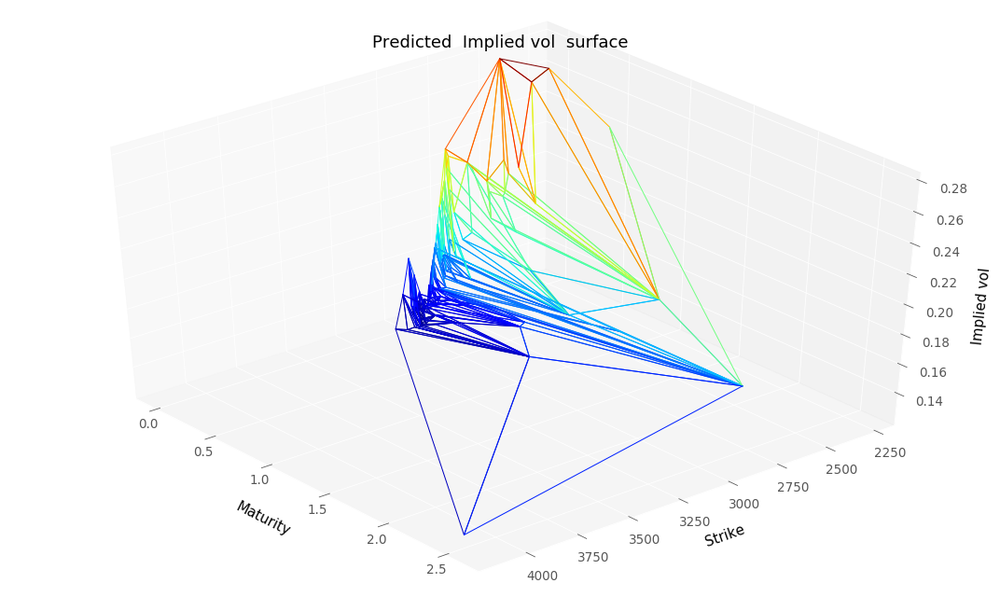

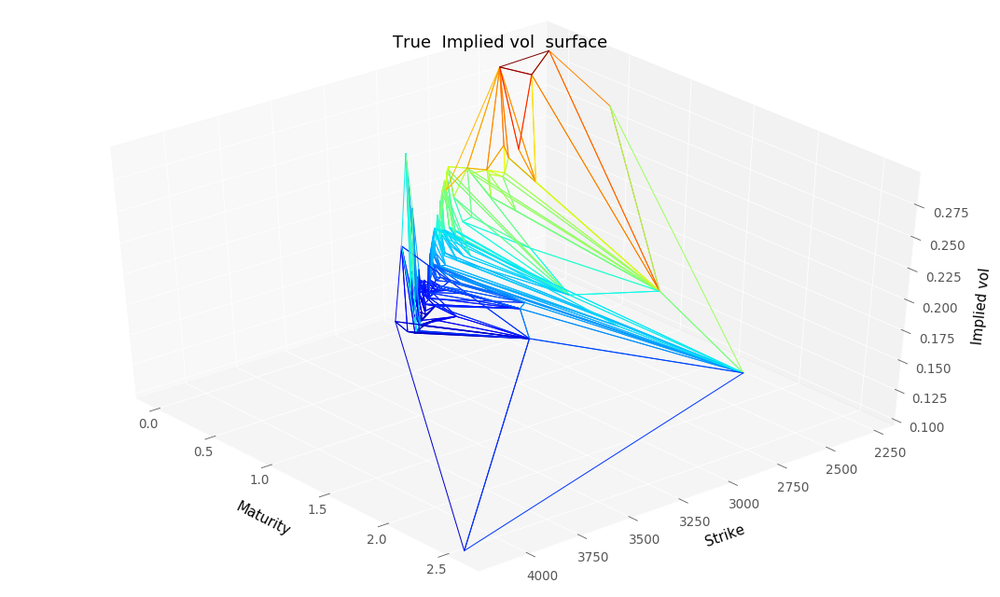

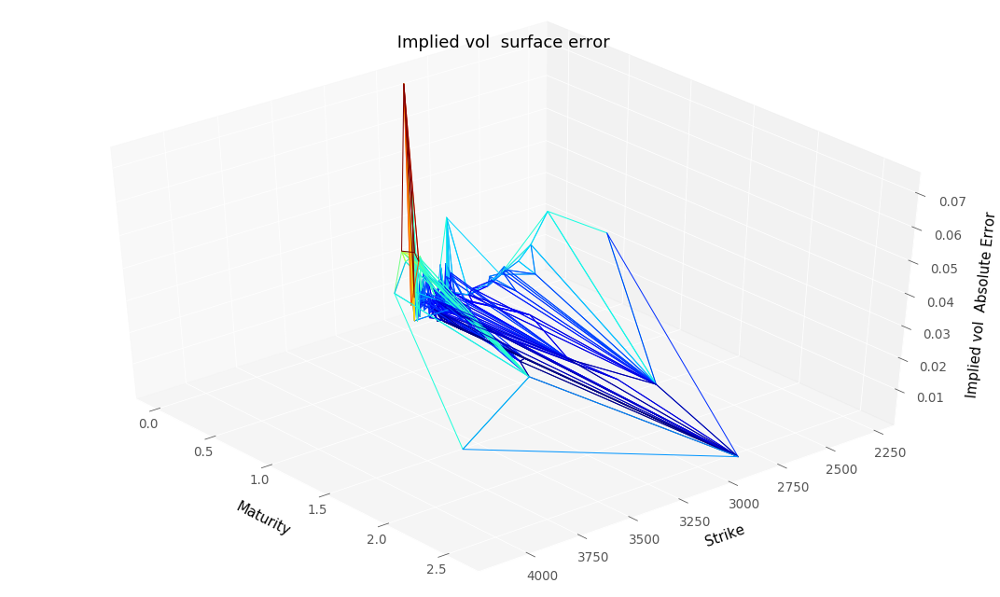

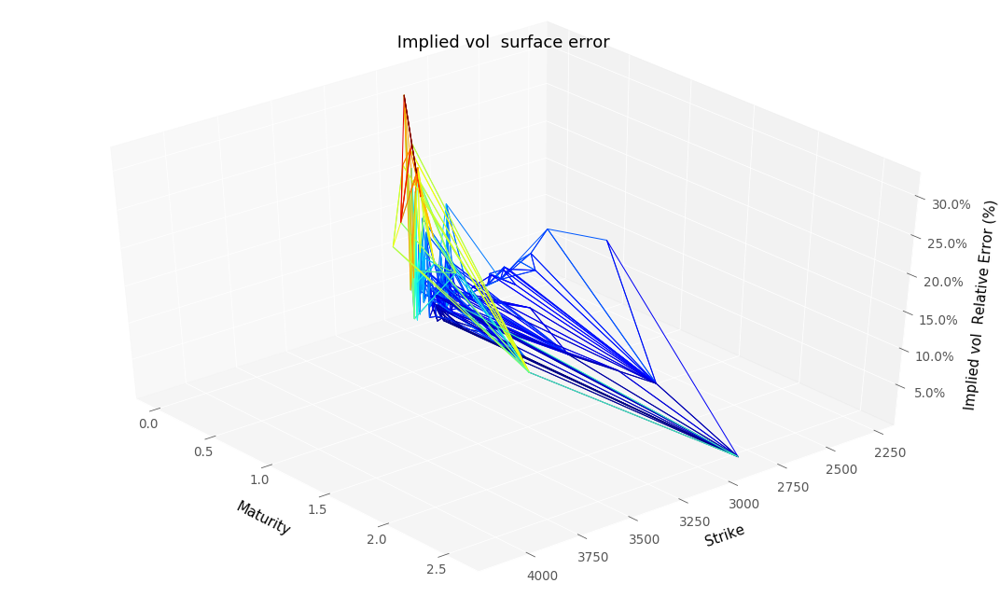

RMSE :  0.013212910846676869
RMSE Relative:  0.09226703832513344


In [25]:
keptPrices = dataSet["Price"][dataSet["Price"] >= 0.0].index
plotTools.predictionDiagnosis(plotTools.selectIndex(serieTrain, keptPrices) , 
                              plotTools.selectIndex(dataSet["ImpliedVol"], keptPrices) , 
                              " Implied vol ", 
                              yMin=KMin,
                              yMax=KMax)

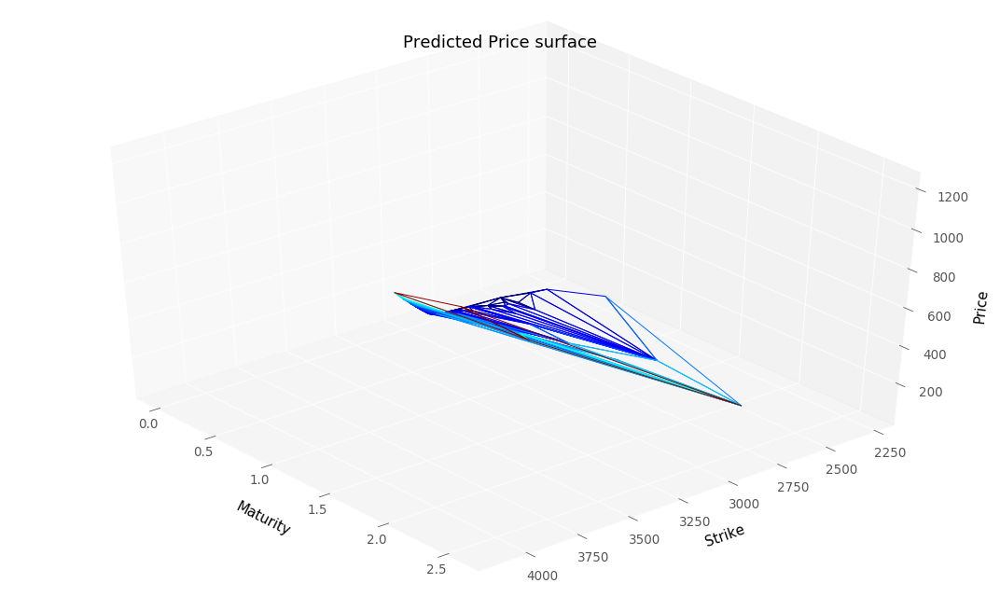

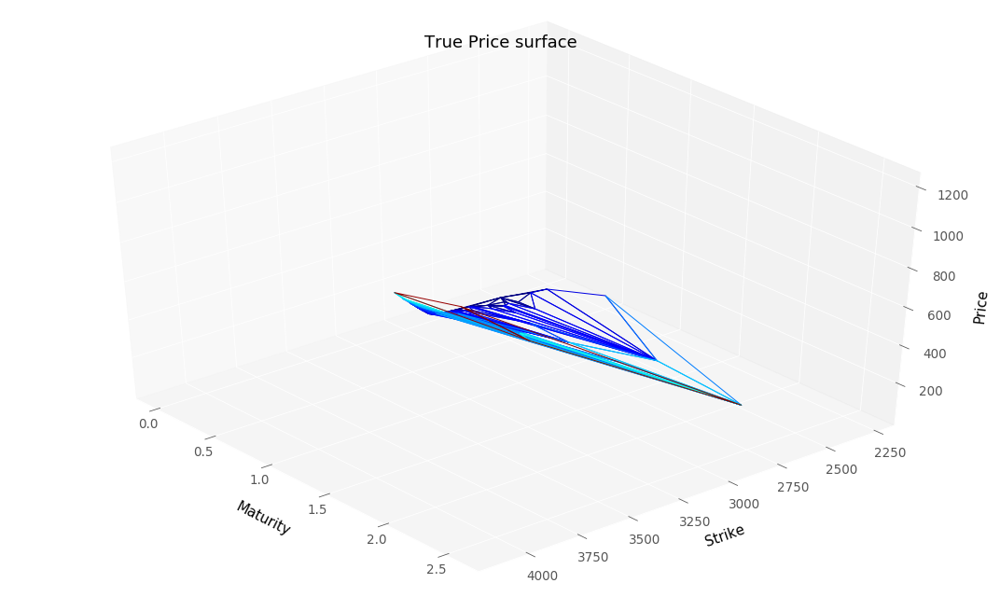

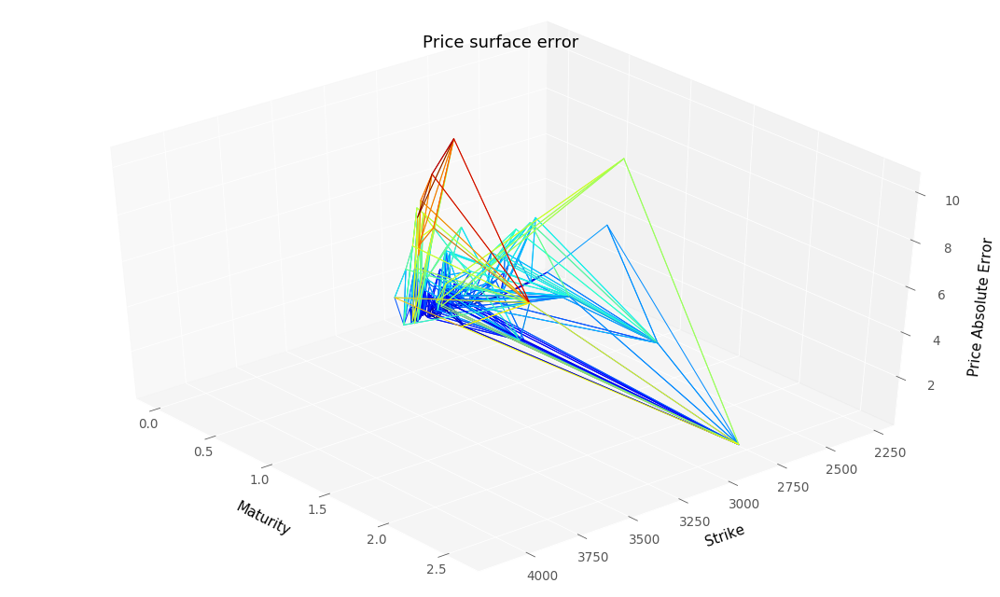

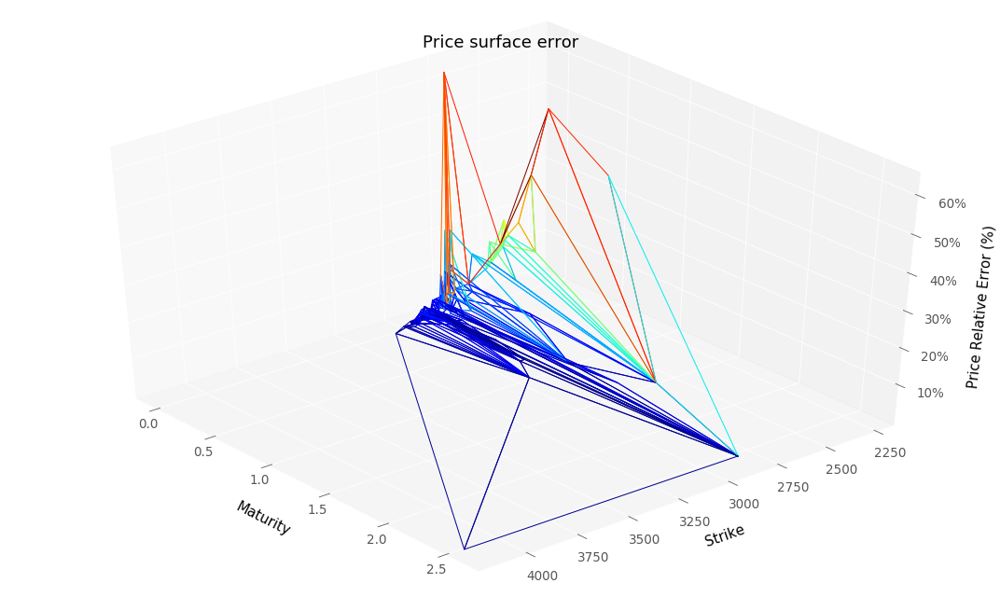

RMSE :  2.552037551262694
RMSE Relative:  0.10680990852402229


In [26]:
impPriceTraining = plotTools.plotImpliedVolPrices(np.square(serieTrain)*serieTrain.index.get_level_values("Maturity"),
                                                  bootstrap, 
                                                  S0, 
                                                  dataSet,
                                                  yMin = KMin,
                                                  yMax = KMax, 
                                                  thresholdPrice = None)

In [27]:
ImpVolPutTrainingSSVI = BS.vectorizedImpliedVolatilityCalibration(S0, bootstrap, 
                                                                 dataSet["Maturity"], 
                                                                 dataSet["Strike"], 
                                                                 dataSet["OptionType"], 
                                                                 impPriceTraining,
                                                                 removeNaN = False)
ImpVolPutTrainingSSVI = pd.Series(ImpVolPutTrainingSSVI, index = dataSet.index).sort_index()

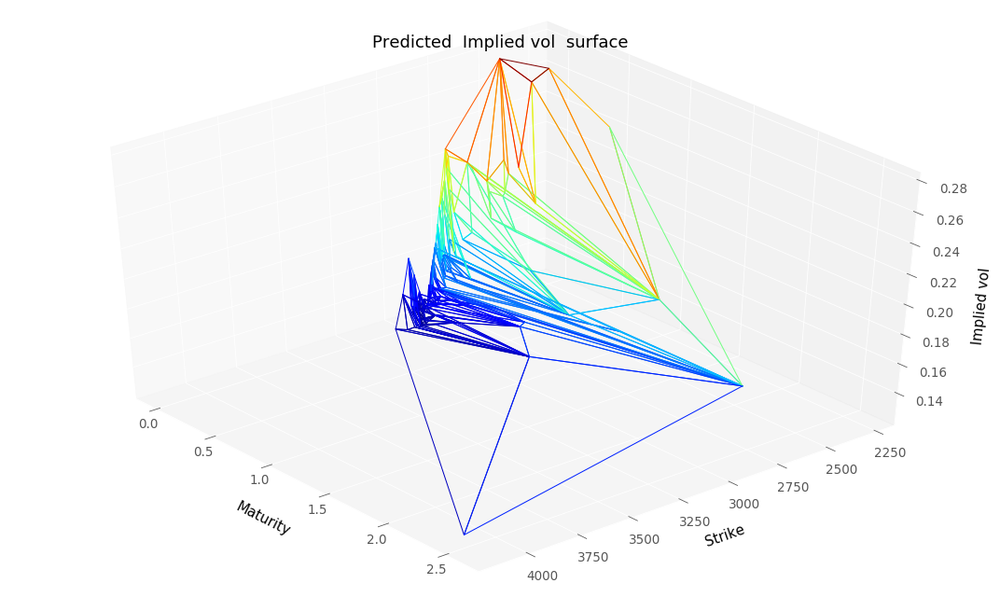

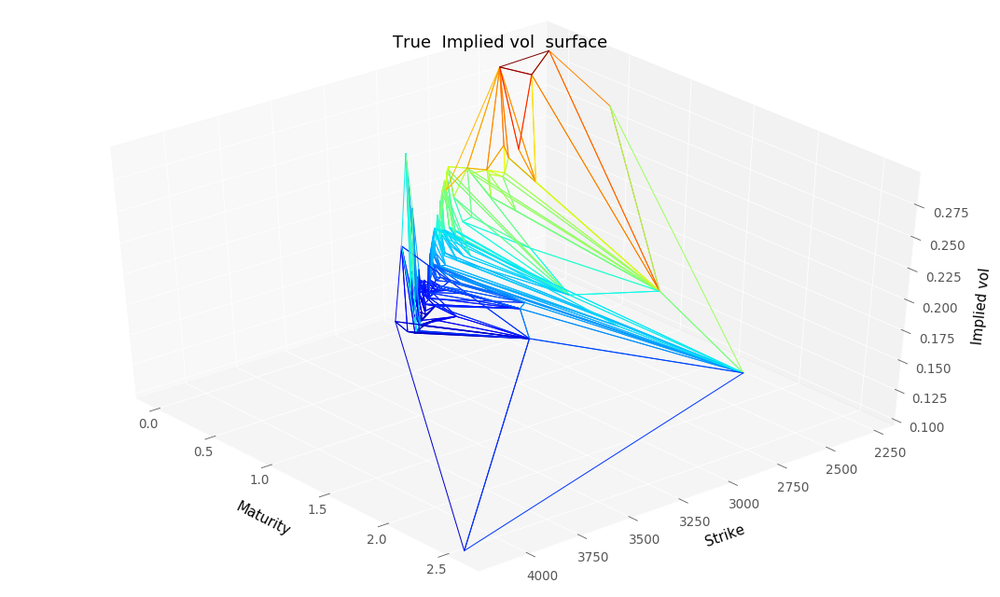

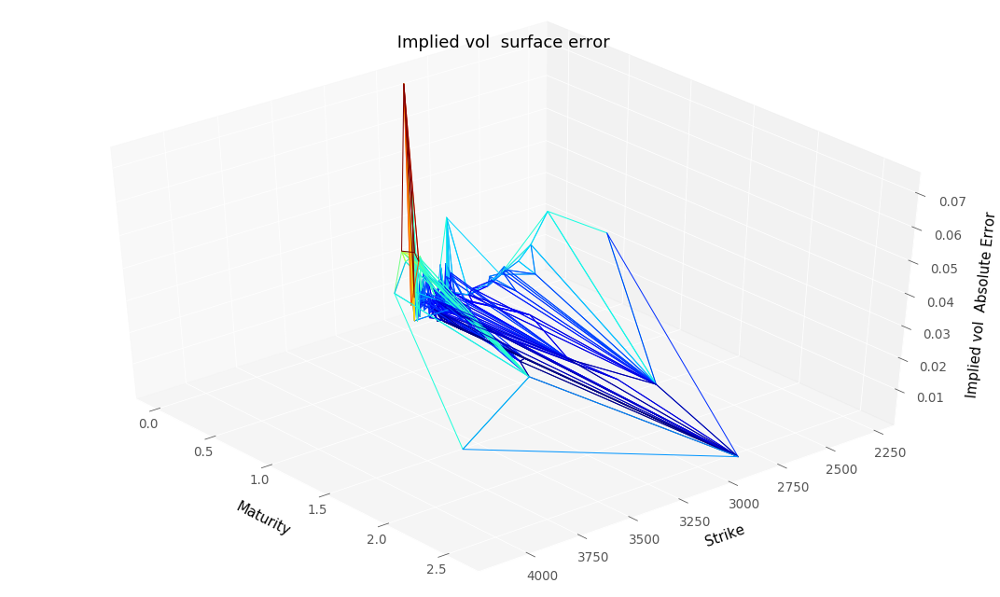

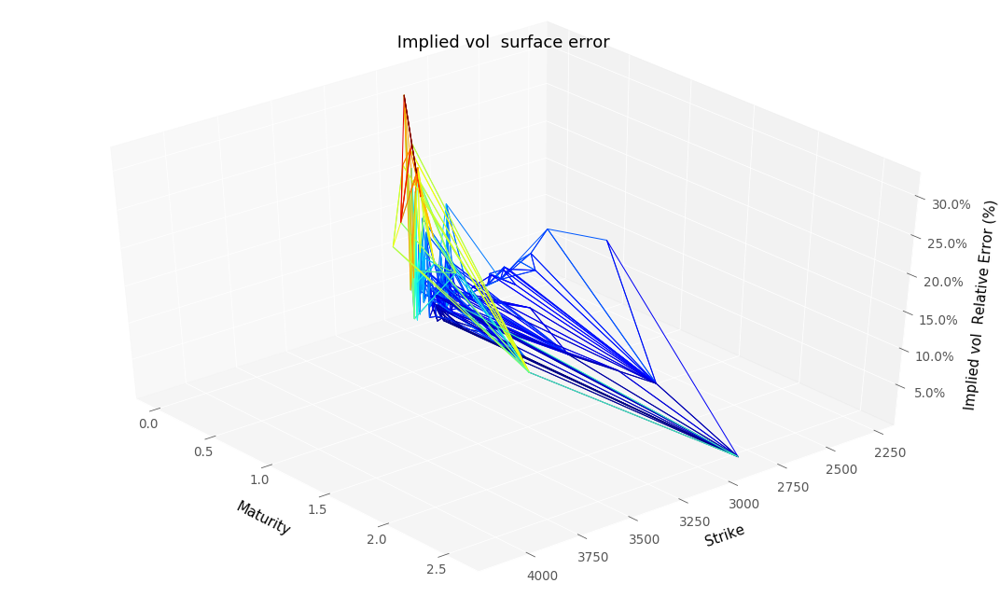

RMSE :  0.013212910803919248
RMSE Relative:  0.0922670382236173


In [28]:
keptPrices = dataSet["Price"][dataSet["Price"] >= 0.0].index
plotTools.predictionDiagnosis(plotTools.selectIndex(ImpVolPutTrainingSSVI, keptPrices) , 
                              plotTools.selectIndex(dataSet["ImpliedVol"], keptPrices) , 
                              " Implied vol ", 
                              yMin=KMin,
                              yMax=KMax)

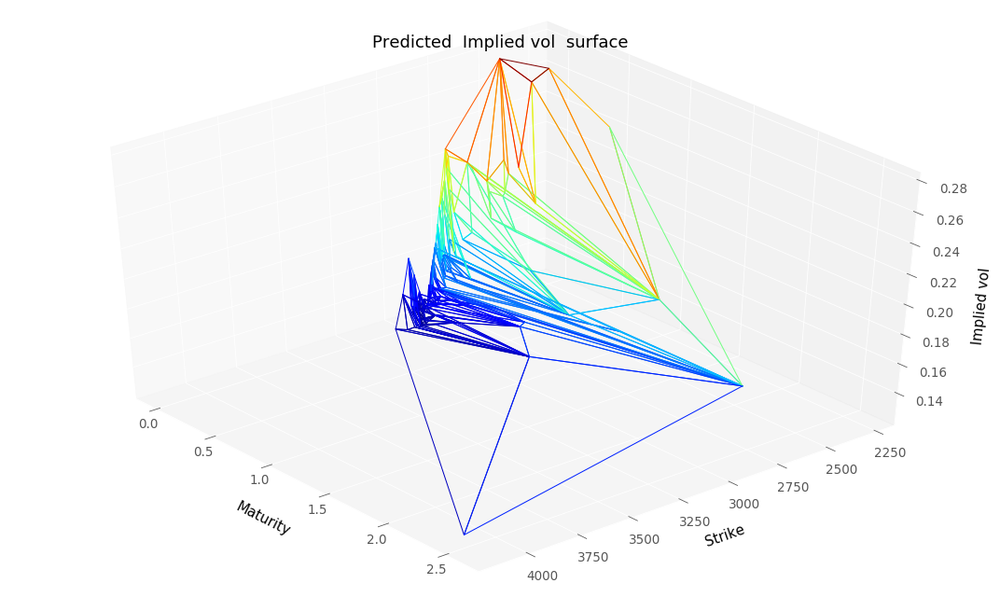

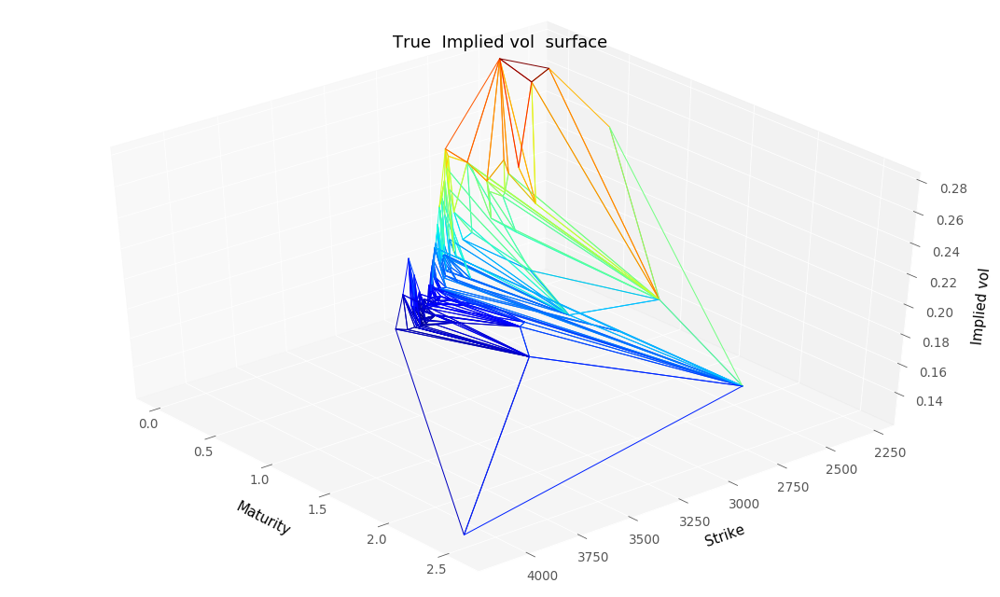

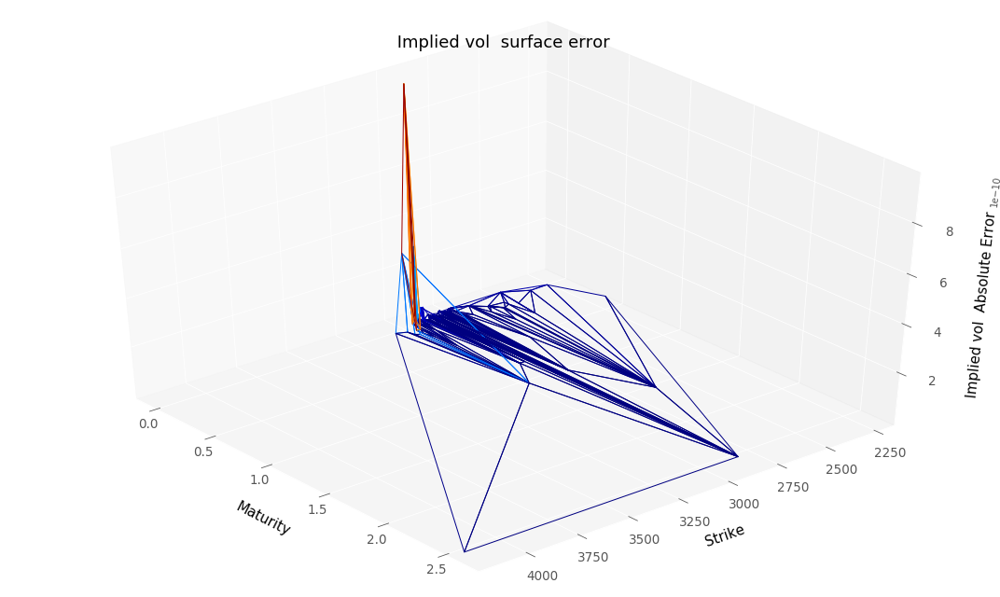

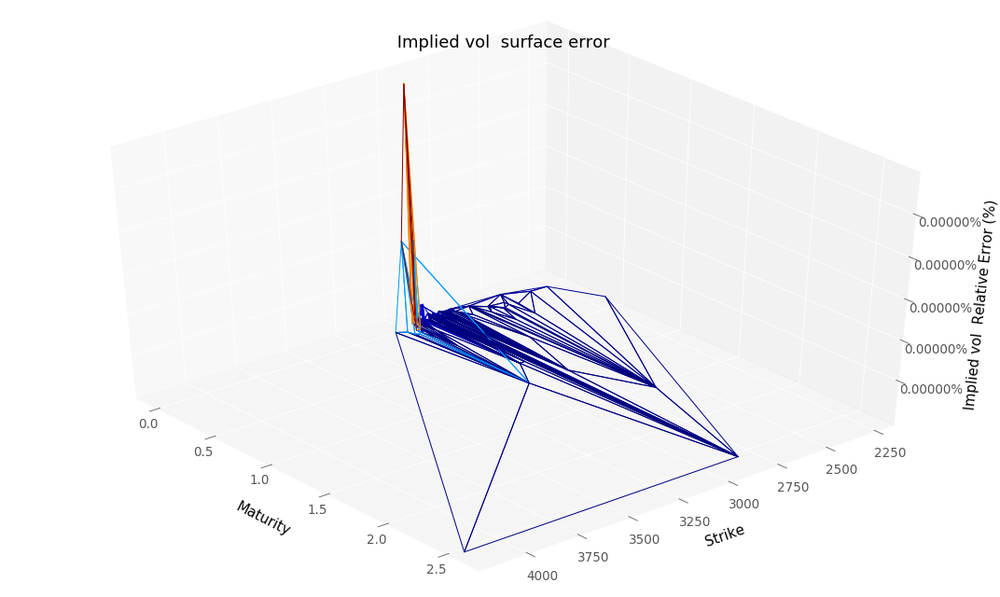

RMSE :  9.280227460361887e-11
RMSE Relative:  5.70544349706989e-10


In [29]:
keptPrices = dataSet["Price"][dataSet["Price"] >= 0.0].index
plotTools.predictionDiagnosis(plotTools.selectIndex(ImpVolPutTrainingSSVI, keptPrices), 
                              plotTools.selectIndex(serieTrain, keptPrices), 
                              " Implied vol ", 
                              yMin=KMin,
                              yMax=KMax)

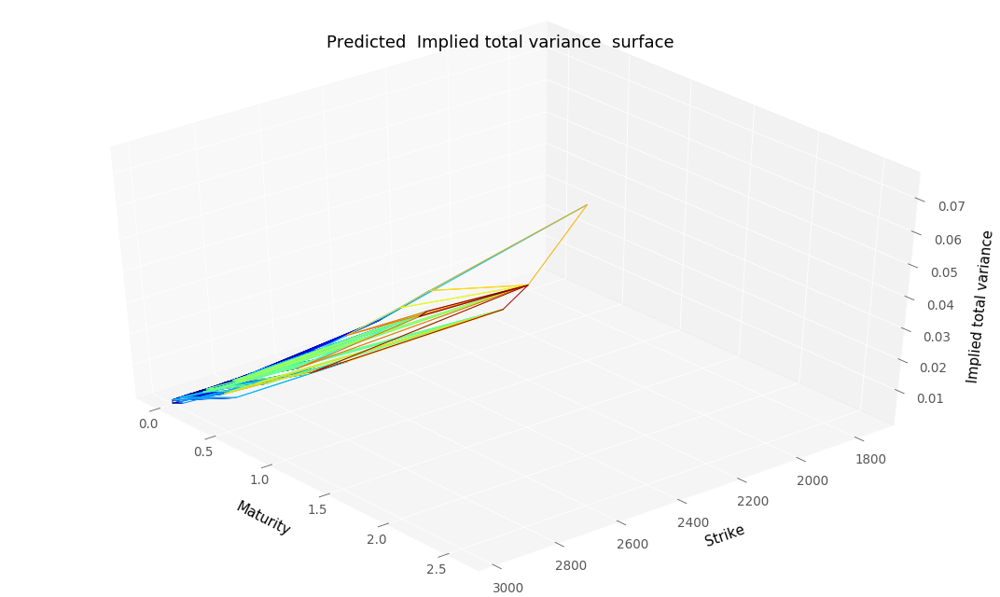

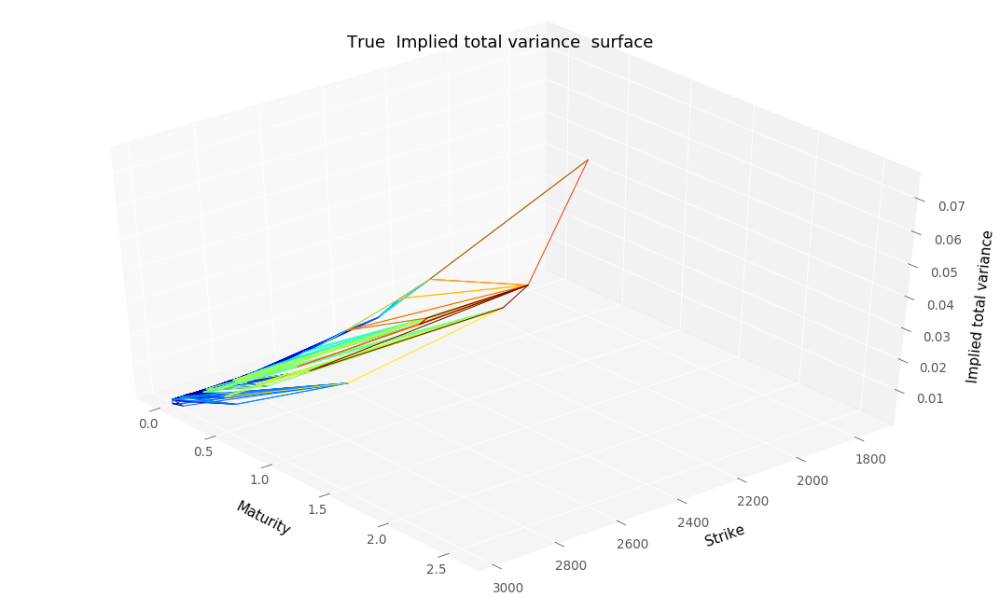

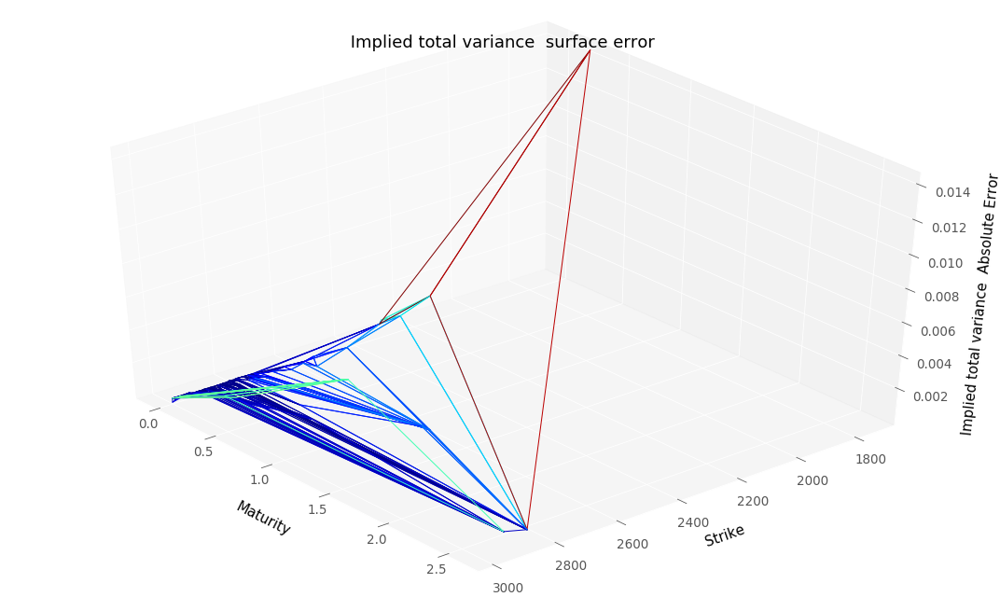

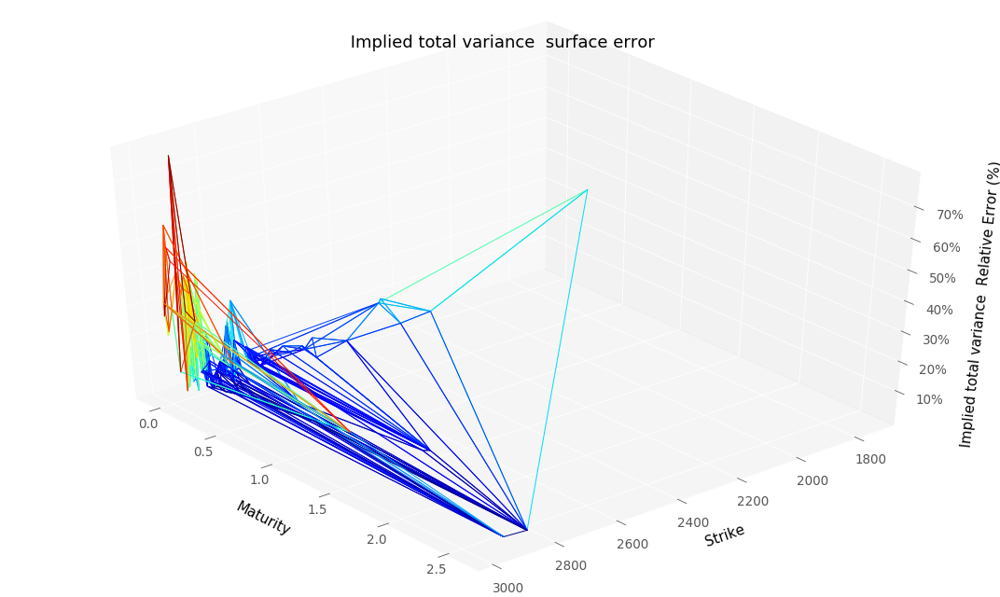

RMSE :  0.0014635842002266191
RMSE Relative:  0.1922169523022949


In [30]:
plotTools.predictionDiagnosis(SSVI.impliedVariance(serie), 
                              SSVI.impliedVariance(dataSetTest["ImpliedVol"]), 
                              " Implied total variance ", 
                              yMin=KMin, 
                              yMax=KMax)

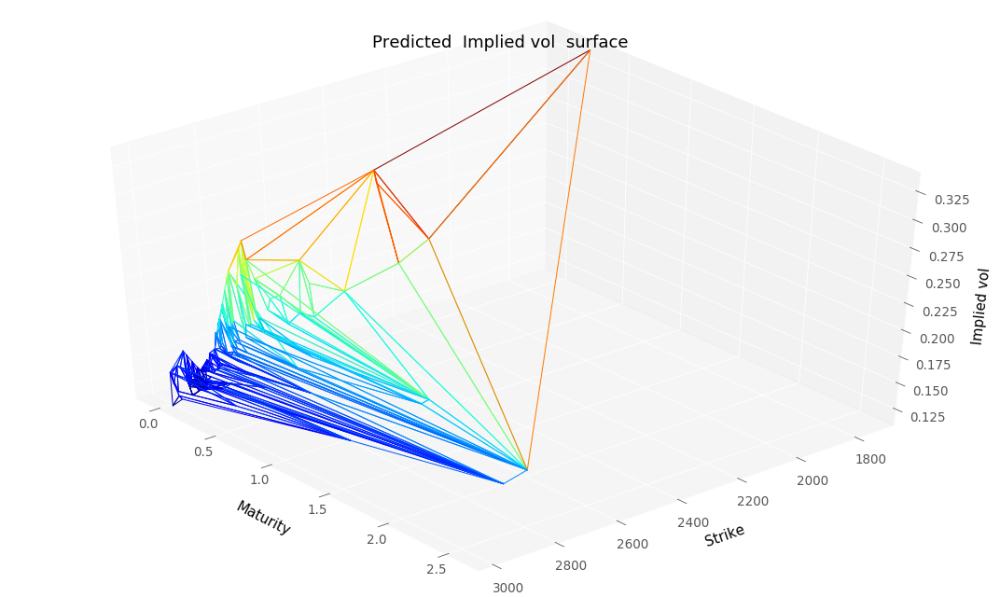

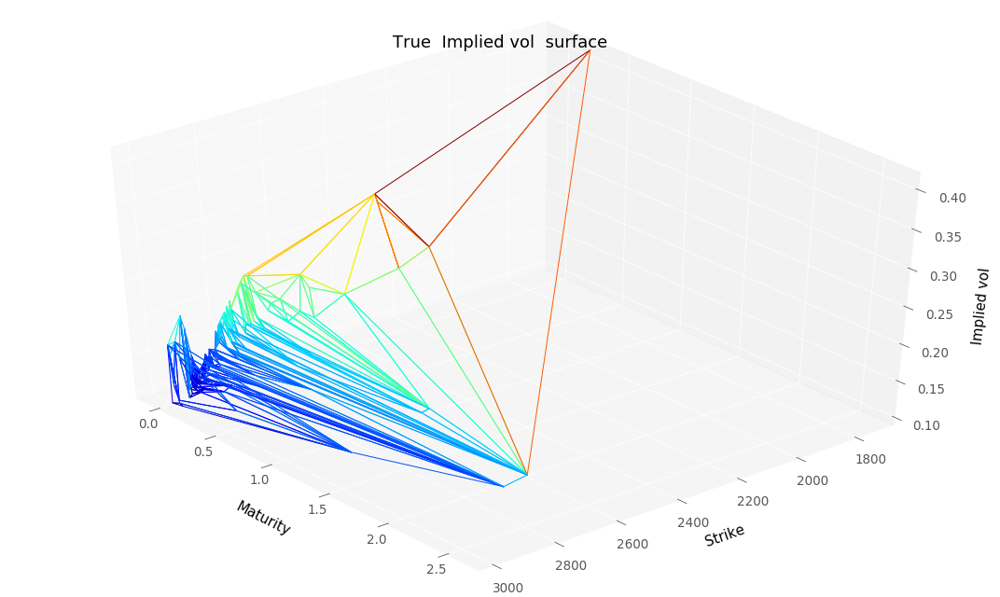

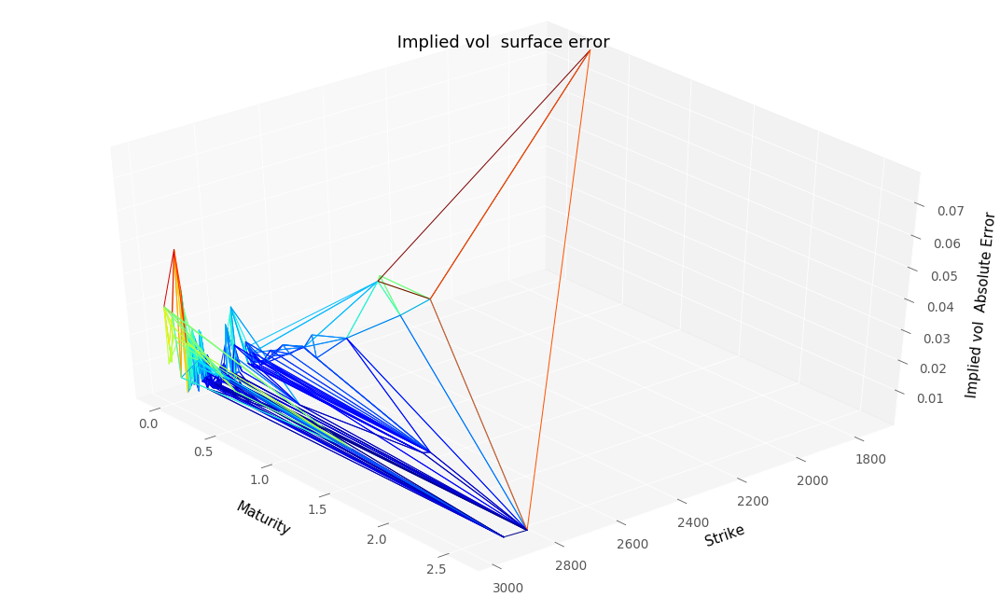

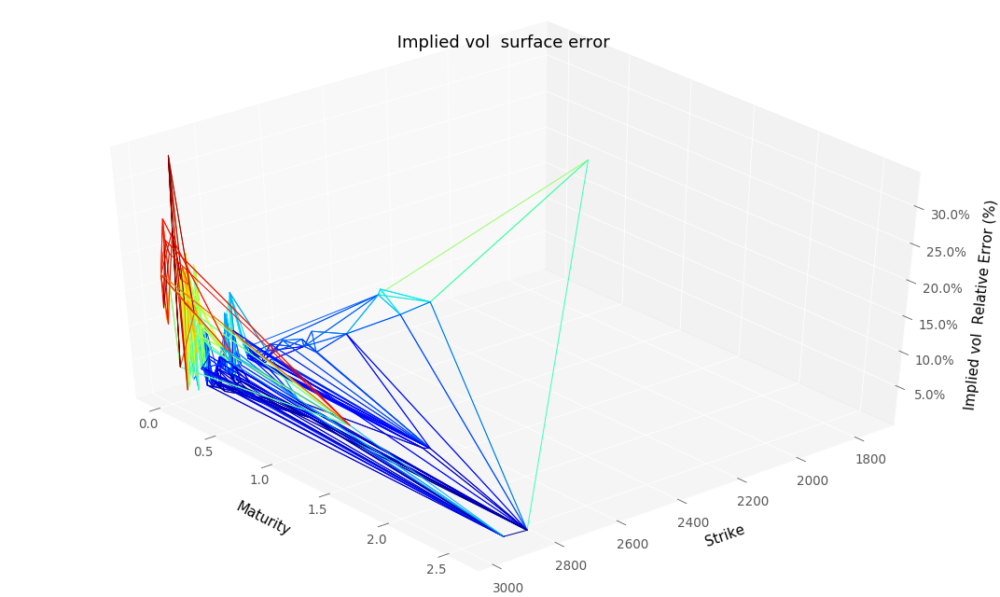

RMSE :  0.013998141592628709
RMSE Relative:  0.09156927886238117


In [31]:
keptPrices = dataSetTest["Price"][dataSetTest["Price"] >= 0.0].index
plotTools.predictionDiagnosis(plotTools.selectIndex(serie, keptPrices), 
                              plotTools.selectIndex(dataSetTest["ImpliedVol"], keptPrices), 
                              " Implied vol ", 
                              yMin=KMin,
                              yMax=KMax)

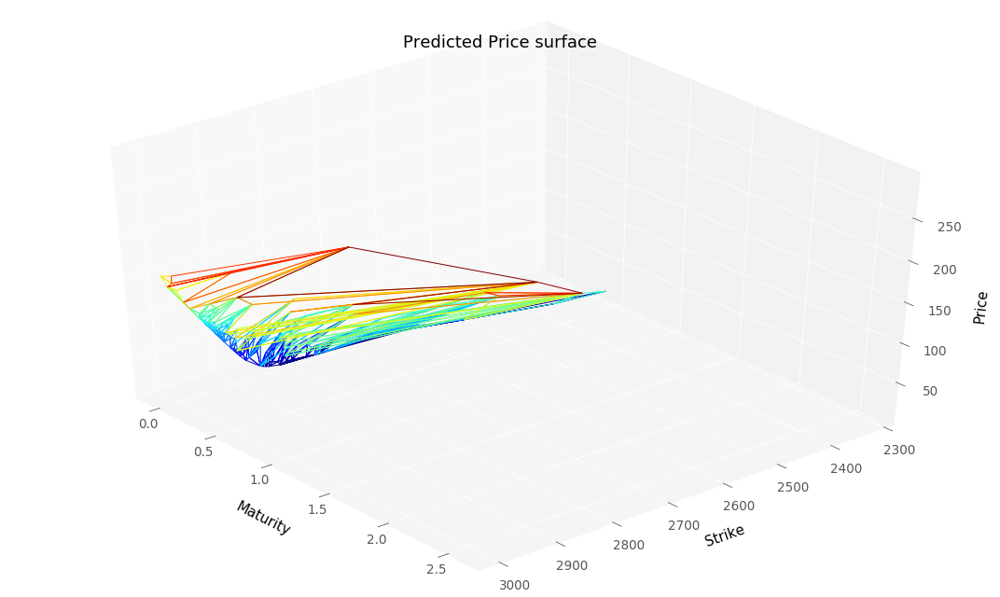

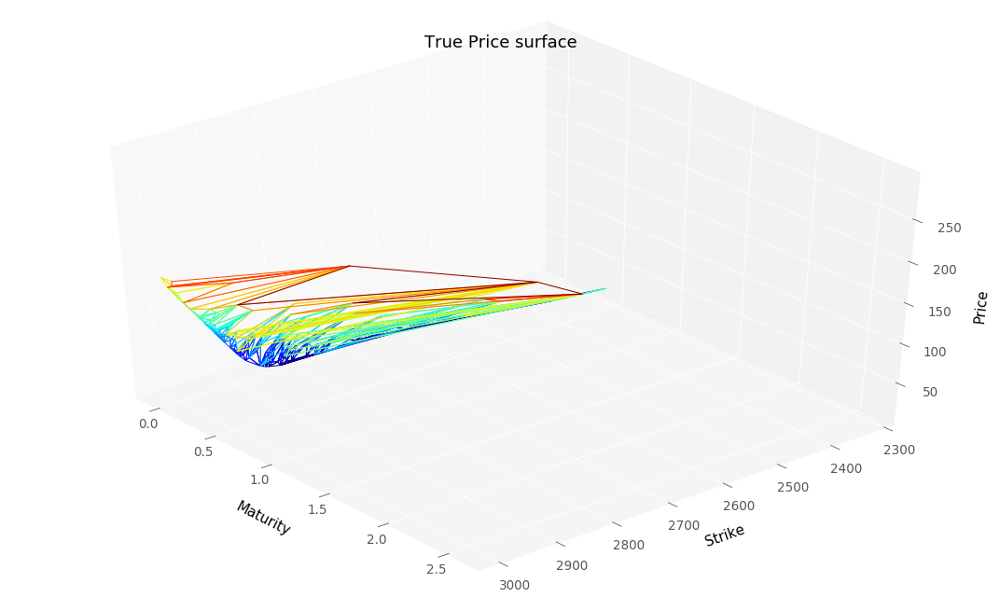

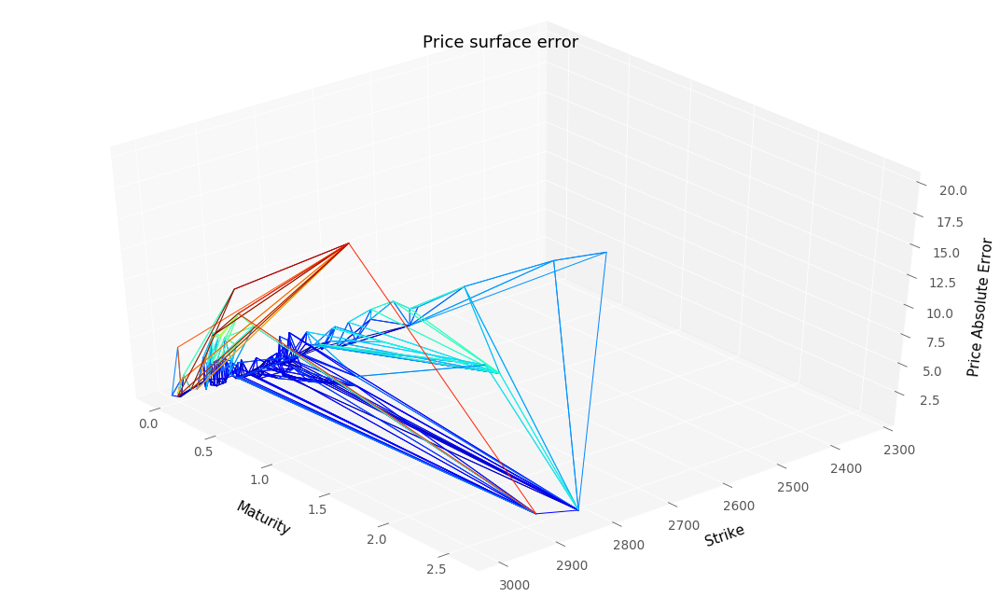

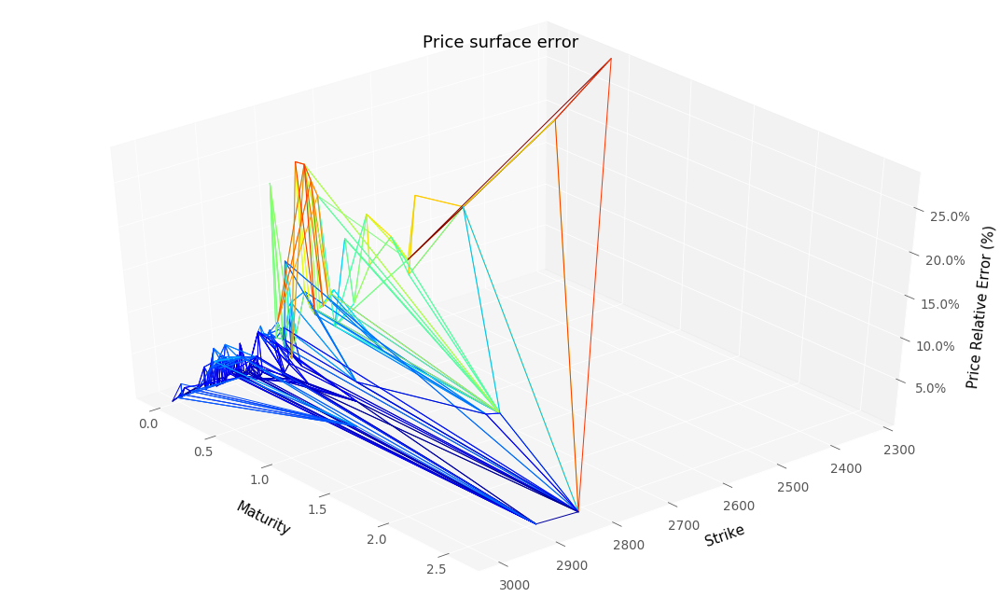

RMSE :  3.13786606037659
RMSE Relative:  0.07163142716810973


In [32]:
impPriceTesting = plotTools.plotImpliedVolPrices(np.square(serie)*serie.index.get_level_values("Maturity"), 
                                                 bootstrap, 
                                                 S0, 
                                                 dataSetTest,
                                                 yMin = KMin,
                                                 yMax = KMax, 
                                                 thresholdPrice = threshold)

In [33]:
ImpVolPutTestingSSVI = BS.vectorizedImpliedVolatilityCalibration(S0, bootstrap, 
                                                                 dataSetTest["Maturity"], 
                                                                 dataSetTest["Strike"], 
                                                                 dataSetTest["OptionType"], 
                                                                 impPriceTesting,
                                                                 removeNaN = False)
ImpVolPutTestingSSVI = pd.Series(ImpVolPutTestingSSVI, index = dataSetTest.index).sort_index()

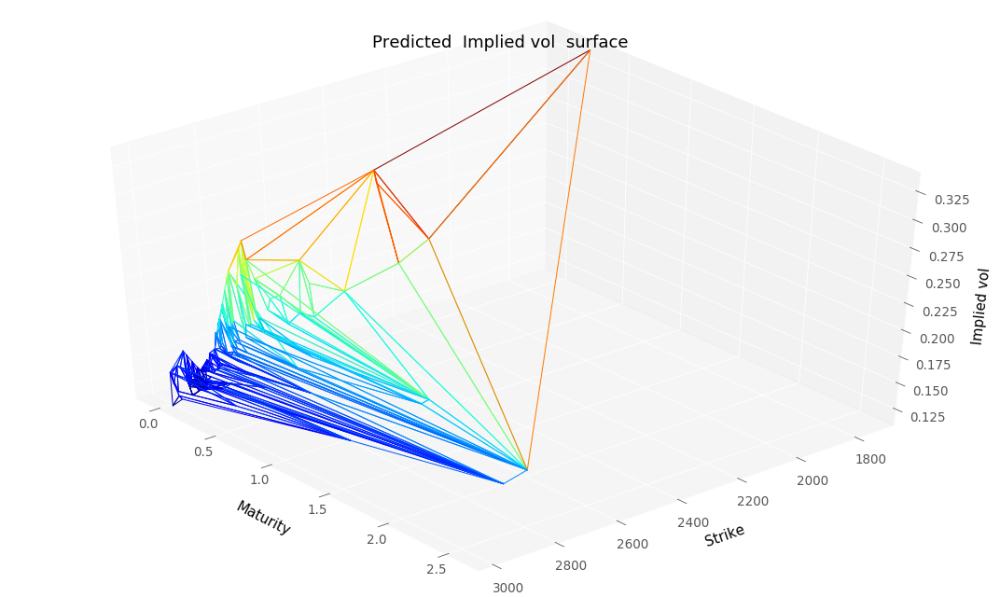

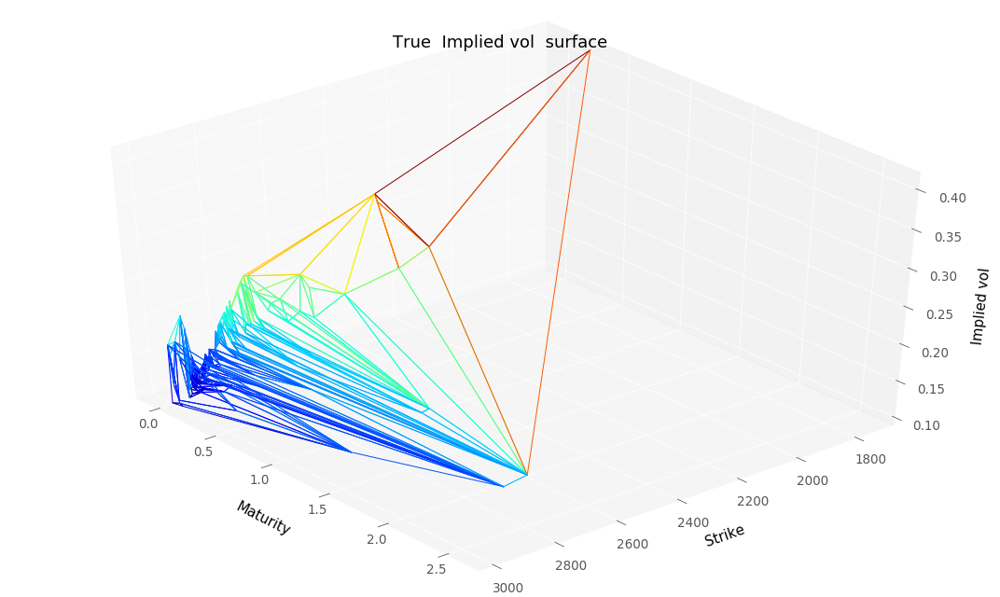

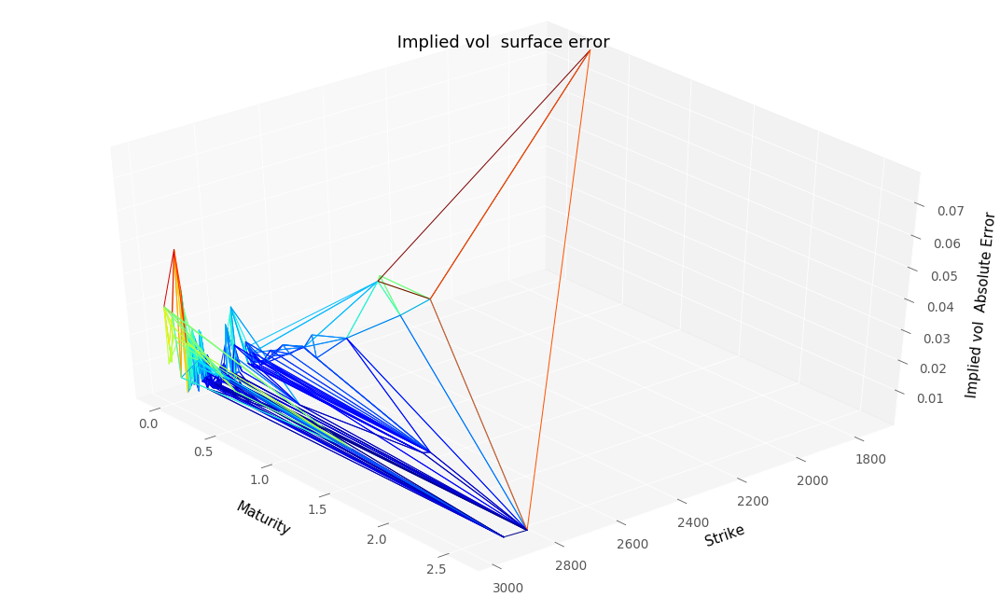

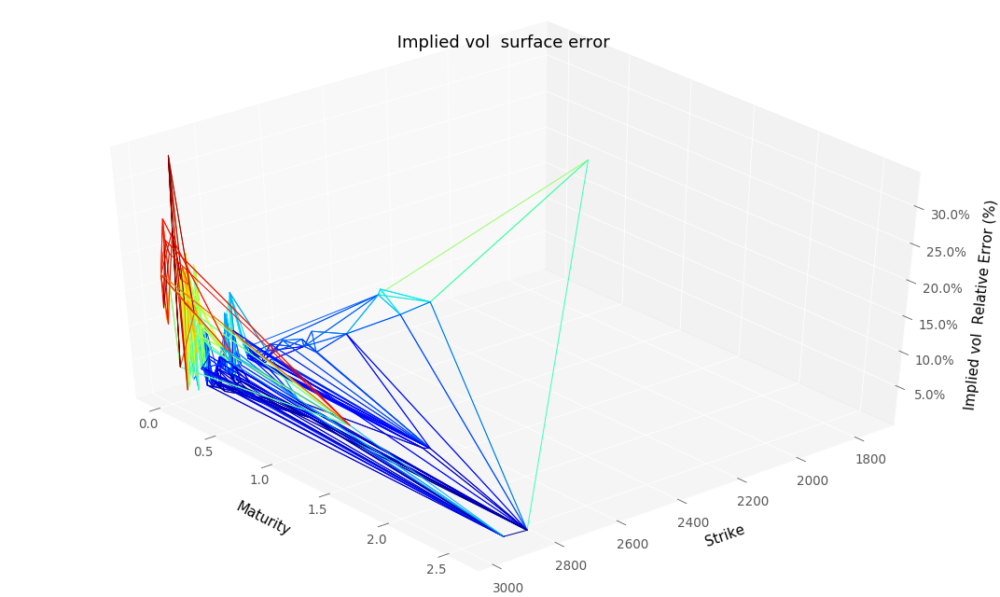

RMSE :  0.01399814159465743
RMSE Relative:  0.09156927887074597


In [34]:
keptPrices = dataSetTest["Price"][dataSetTest["Price"] >= 0.0].index
plotTools.predictionDiagnosis(plotTools.selectIndex(ImpVolPutTestingSSVI, keptPrices), 
                              plotTools.selectIndex(dataSetTest["ImpliedVol"], keptPrices), 
                              " Implied vol ", 
                              yMin=KMin,
                              yMax=KMax)

#### Estimate Local Volaitlity from SSVI

In [35]:
#dT, hk, dK, locVolSSVI, density = finiteDifferenceSVI(dataSet, interpolateWithSSVI)
dTTrain, hkTrain, dKTrain, locVolSSVITrain, densityTrain = SSVI.finiteDifferenceSVI(dataSet, SSVIModel.eval)

Number of arbitrage violations :  0
Arbitrable volatility :  Series([], Name: ImpliedVol, dtype: float64)
Interpolated Arbitrable volatility :  Series([], dtype: float64)


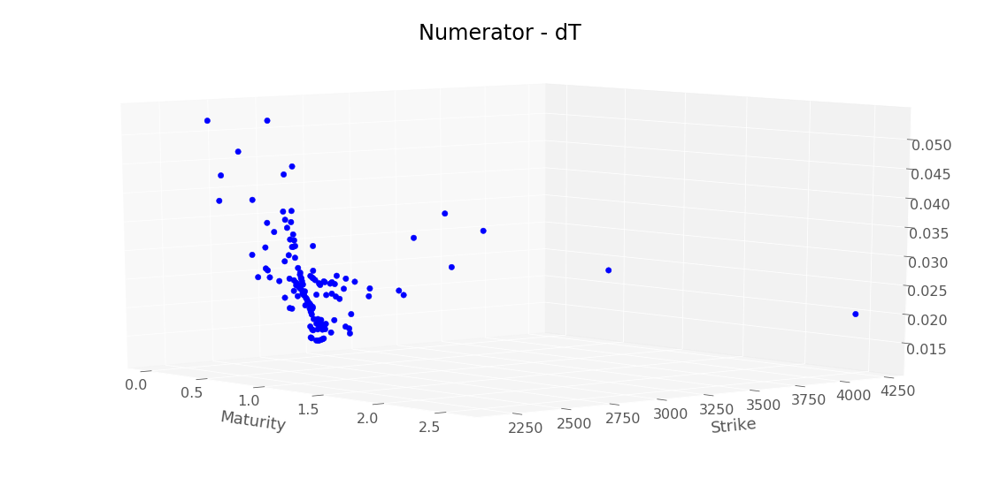

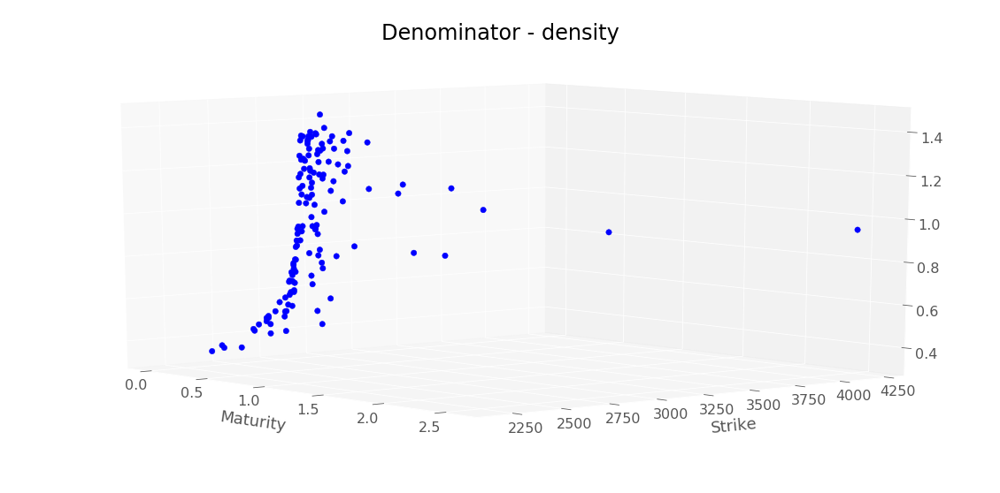

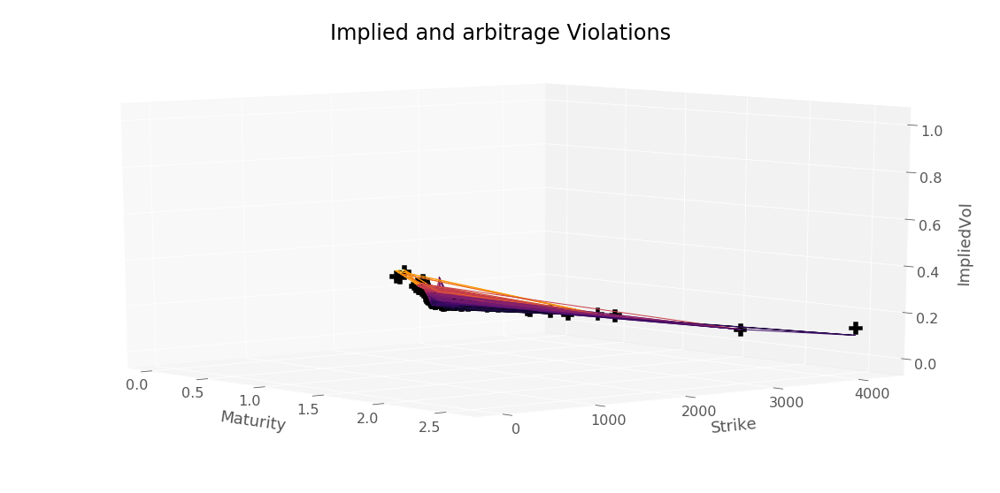

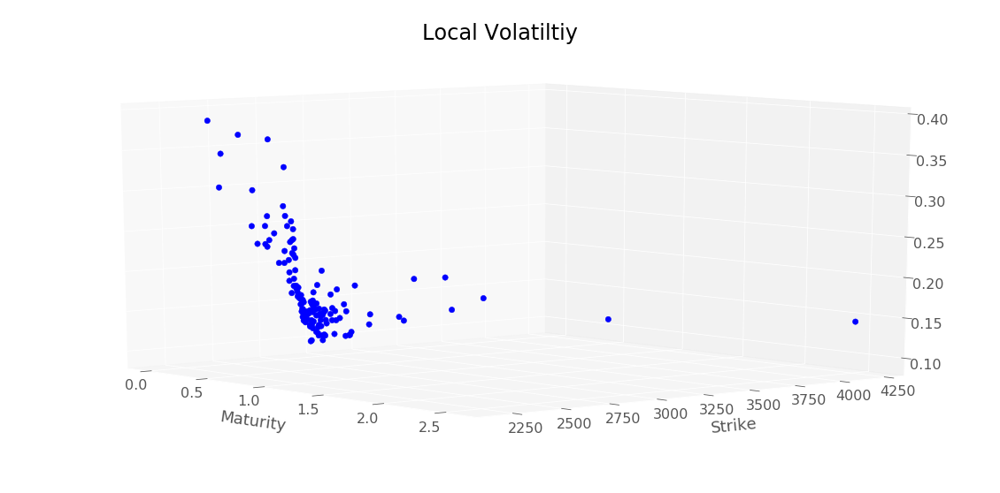

In [36]:
plotTools.diagnoseLocalVol(dTTrain,
                           locVolSSVITrain,
                           densityTrain,
                           SSVIModel.eval(dataSet),
                           dataSet,
                           az=320,
                           yMin=KMin,
                           yMax=KMax)

In [37]:
#dT, hk, dK, locVolSSVI, density = finiteDifferenceSVI(dataSet, interpolateWithSSVI)
dT, hk, dK, locVolSSVI, density = SSVI.finiteDifferenceSVI(dataSetTest, SSVIModel.eval)

Number of arbitrage violations :  0
Arbitrable volatility :  Series([], Name: ImpliedVol, dtype: float64)
Interpolated Arbitrable volatility :  Series([], dtype: float64)


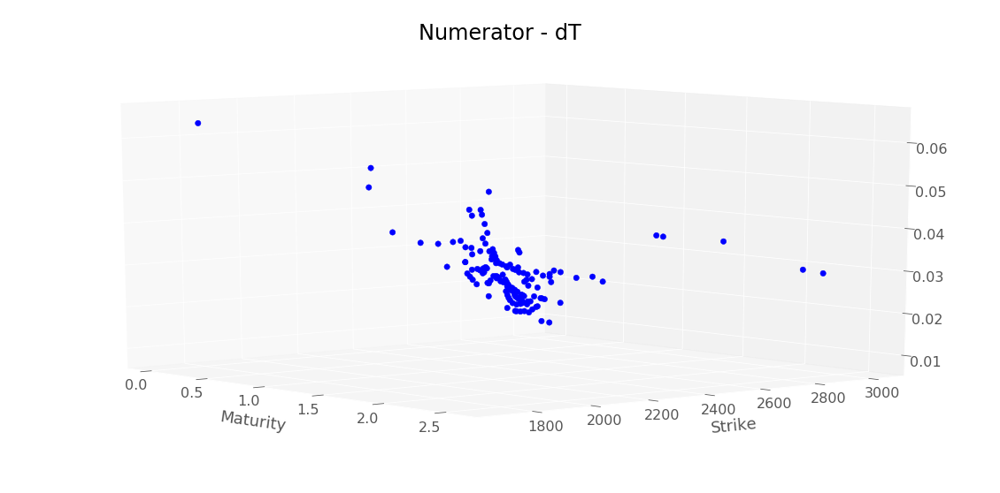

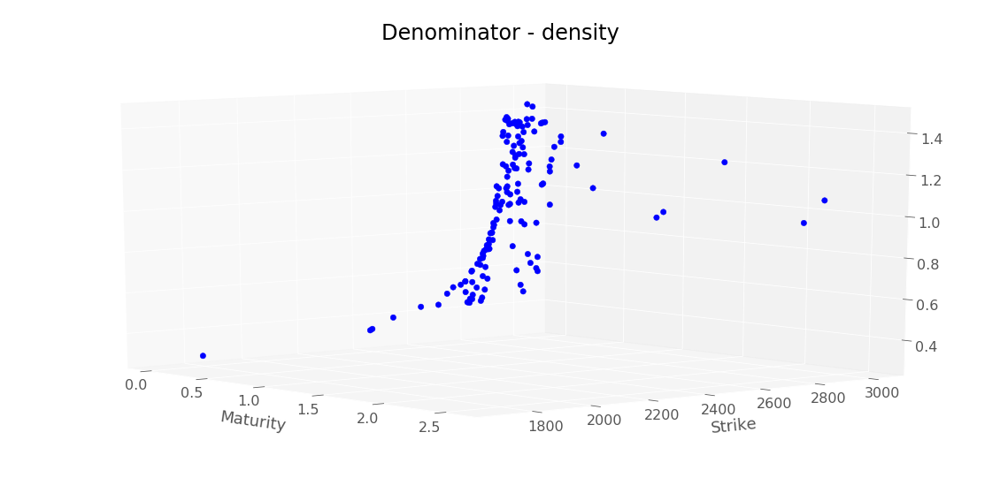

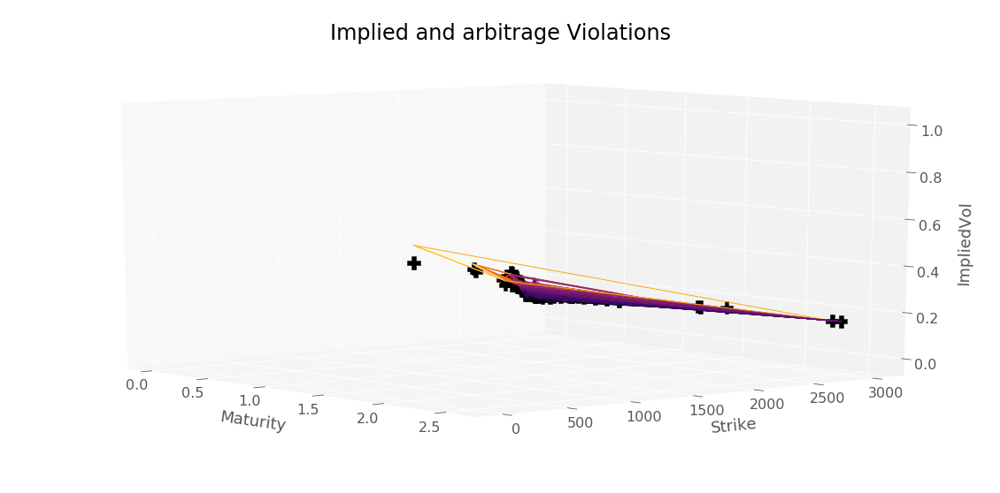

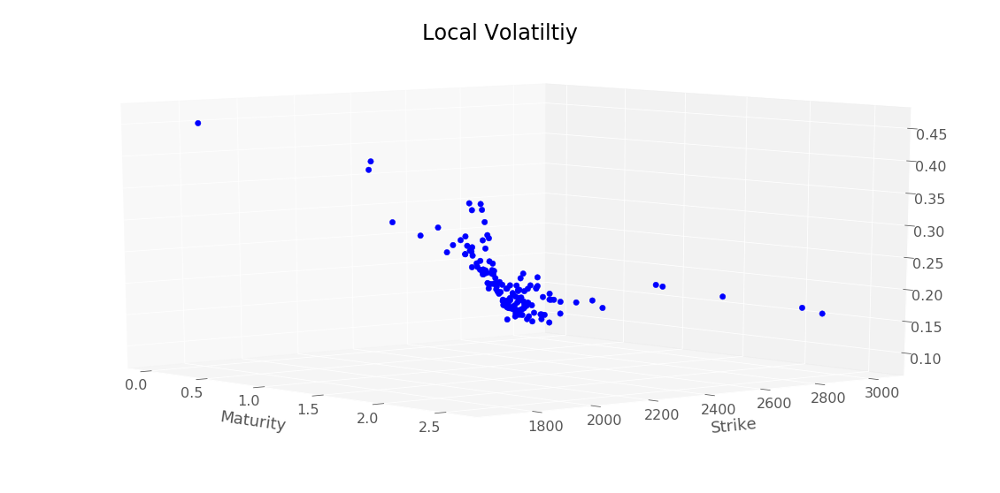

In [38]:
plotTools.diagnoseLocalVol(dT,
                           locVolSSVI,
                           density,
                           SSVIModel.eval(dataSetTest),
                           dataSetTest,
                           az=320,
                           yMin=KMin,
                           yMax=KMax)

In [39]:
plotTools.saveDataModel(plotTools.removeDuplicateIndex(impPriceTraining), 
                        plotTools.removeDuplicateIndex(locVolSSVITrain), 
                        plotTools.removeDuplicateIndex(serieTrain) , 
                        "./Results/SSVITraining") 

In [40]:
plotTools.saveDataModel(plotTools.removeDuplicateIndex(impPriceTesting), 
                        plotTools.removeDuplicateIndex(locVolSSVI), 
                        plotTools.removeDuplicateIndex(serie) , 
                        "./Results/SSVITesting") 

In [41]:
strikeLow = min(dataSet["Strike"].min(),dataSetTest["Strike"].min()) #dataSet["Strike"].min()
strikeUp = max(dataSet["Strike"].max(),dataSetTest["Strike"].max()) #dataSet["Strike"].max()
strikeGrid = np.linspace(strikeLow, strikeUp, 100)
matLow = min(dataSet["Maturity"].min(),dataSetTest["Maturity"].min()) #dataSet["Maturity"].min()
matUp = max(dataSet["Maturity"].max(),dataSetTest["Maturity"].max()) #dataSetTest["Maturity"].max()
matGrid = np.linspace(matLow, matUp, 100)
volLocaleGrid = np.meshgrid(strikeGrid, matGrid)
volLocaleGridDf = pd.DataFrame(np.vstack((np.ravel(volLocaleGrid[0]), np.ravel(volLocaleGrid[1]))).T, 
                               columns = ["Strike", "Maturity"]).set_index(["Strike","Maturity"],drop=False)
volLocaleGridDf["ChangedStrike"] = bootstrap.changeOfVariable(volLocaleGridDf["Strike"], volLocaleGridDf["Maturity"])[0]
volLocaleGridDf["logMoneyness"] = np.log(volLocaleGridDf["ChangedStrike"] / S0)
volLocaleGridDf["OptionType"] = np.ones_like(volLocaleGridDf["logMoneyness"])

In [42]:
dT, hk, dK, locVolSSVI, density = SSVI.finiteDifferenceSVI(volLocaleGridDf, SSVIModel.eval)

./code/SSVI.py:1105: RuntimeWarning: invalid value encountered in sqrt
  locVolGatheral = np.sqrt(dT / numerator)


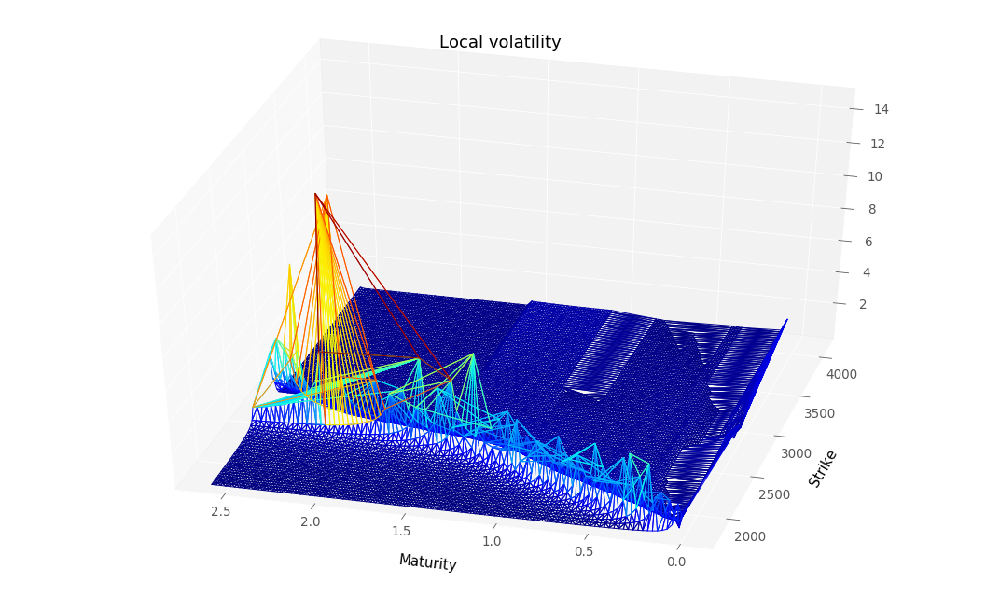

In [43]:
plotTools.plotSerie(locVolSSVI.dropna(),
                    yMin=KMin,
                    yMax=KMax, 
                    az=105,
                    Title = 'Local volatility')

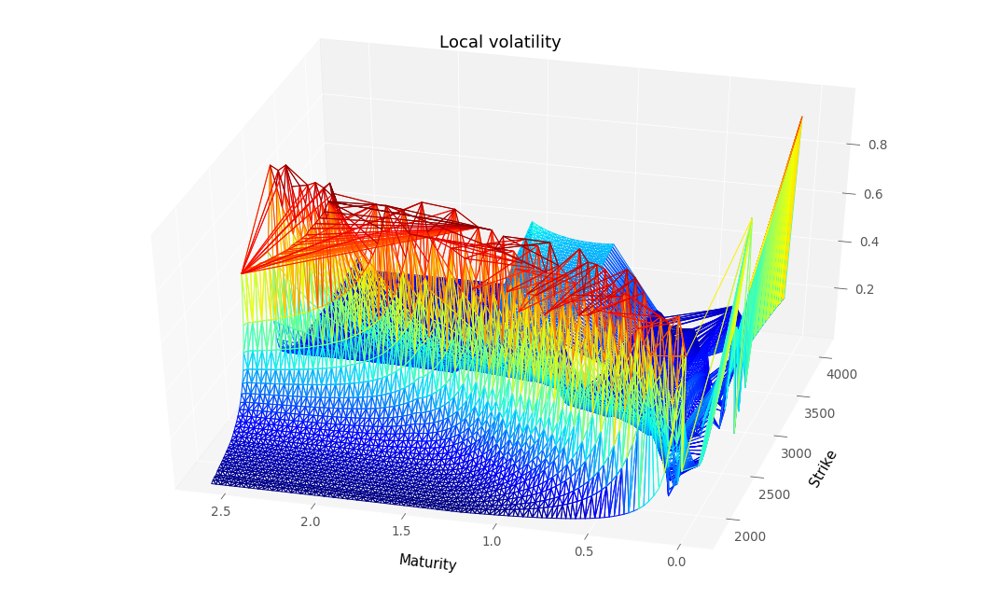

In [44]:
plotTools.plotSerie(locVolSSVI.dropna()[locVolSSVI.dropna() <= 1.0],
                    yMin=KMin,
                    yMax=KMax, 
                    az=105,
                    Title = 'Local volatility')

#### Backtest Local volatility SSVI 

During Monte Carlo backtest, each option in testing set is priced with an underlying which is diffused with the following SDE : 
$$ dS_t = \left( r_t - q_t - \frac{\sigma_{NN}^2(t, S_t)}{2} \right) dt + \sigma_{NN}(t, S_t) dW_t$$
with $\sigma_{NN}$ the neural local volatility function.

Due to computation time issue we avoid to make millions of call to neural network and we interpolate linearly neural local volatility obtained on one the two possible grid :
- the testing grid i.e. nodes $(T,K)$ of the testing set.
- an artificial grid of 10000 points to check local volatility is correctly interpolated/extrapolated. That grid is the smallest rectangle containing the minimum and maximum maturities and the minimum and maximum strikes of our dataset (union of testing and training set).

During PDE backtest, we used a crank-nicholson scheme to revaluate each option in our testing set.
Time step corresponds to one day and space grid has 100 points. 

In [45]:
nbTimeStep = 100
nbPaths = 100

In [46]:
#dT, hk, dK, locVolSSVI, density = finiteDifferenceSVI(dataSet, interpolateWithSSVI)
dT, hk, dK, locVolSSVI, density = SSVI.finiteDifferenceSVI(dataSetTest, SSVIModel.eval)
nnSSVI = lambda x,y : backtest.interpolatedMCLocalVolatility(locVolSSVI, x, y)

In [47]:
strikeLow = min(dataSet["Strike"].min(),dataSetTest["Strike"].min()) #dataSet["Strike"].min()
strikeUp = max(dataSet["Strike"].max(),dataSetTest["Strike"].max()) #dataSet["Strike"].max()
strikeGrid = np.linspace(strikeLow, strikeUp, 100)
matLow = min(dataSet["Maturity"].min(),dataSetTest["Maturity"].min()) #dataSet["Maturity"].min()
matUp = max(dataSet["Maturity"].max(),dataSetTest["Maturity"].max()) #dataSetTest["Maturity"].max()
matGrid = np.linspace(matLow, matUp, 100)
volLocaleGrid = np.meshgrid(strikeGrid, matGrid)
volLocaleGridDf = pd.DataFrame(np.vstack((np.ravel(volLocaleGrid[0]), np.ravel(volLocaleGrid[1]))).T, 
                               columns = ["Strike", "Maturity"]).set_index(["Strike","Maturity"],drop=False)
volLocaleGridDf["ChangedStrike"] = bootstrap.changeOfVariable(volLocaleGridDf["Strike"], volLocaleGridDf["Maturity"])[0]
volLocaleGridDf["logMoneyness"] = np.log(volLocaleGridDf["ChangedStrike"] / S0)
volLocaleGridDf["OptionType"] = np.ones_like(volLocaleGridDf["logMoneyness"])

In [48]:
volLocaleGridDf.head()

,,Strike,Maturity,ChangedStrike,logMoneyness,OptionType
Strike,Maturity,,,,,
1700.000000,0.005,1700.000000,0.005,1698.937070,-0.520654,1.0
1725.252525,0.005,1725.252525,0.005,1724.173806,-0.505909,1.0
1750.505051,0.005,1750.505051,0.005,1749.410542,-0.491378,1.0
1775.757576,0.005,1775.757576,0.005,1774.647278,-0.477056,1.0
1801.010101,0.005,1801.010101,0.005,1799.884015,-0.462935,1.0


In [49]:
#dT, hk, dK, locVolSSVI, density = finiteDifferenceSVI(dataSet, interpolateWithSSVI)
dT2, hk2, dK2, locVolSSVI2, density2 = SSVI.finiteDifferenceSVI(volLocaleGridDf, SSVIModel.eval)
cleanValue = ~(dT2.isna() | density2.isna() | (dT2 < 0) | (density2 < 0) )
dT2 = dT2[cleanValue.values]
density2 = density2[cleanValue.values]
hk2 = hk2[cleanValue.values]
locVolSSVI2 = locVolSSVI2[cleanValue.values]
dK2 = dK2[cleanValue.values]

nnSSVI2 = lambda x,y : backtest.interpolatedMCLocalVolatility(locVolSSVI2, x, y)

In [50]:
mcResSSVITest = backtest.MonteCarloPricerVectorized(S0,
                                                    dataSetTest,
                                                    bootstrap,
                                                    nbPaths,
                                                    nbTimeStep,
                                                    nnSSVI)
mcResSSVITest.head()

Price    stdPrice
Strike Maturity                       
1700.0 0.246      0.000000    0.000000
2300.0 0.419     20.429639   76.521153
2350.0 0.093      0.000000    0.000000
       0.112      1.291824   12.889273
2400.0 0.419     38.752842  149.903377

In [51]:
mcResSSVITest.to_csv(workingFolder + "mcResSSVITest.csv")

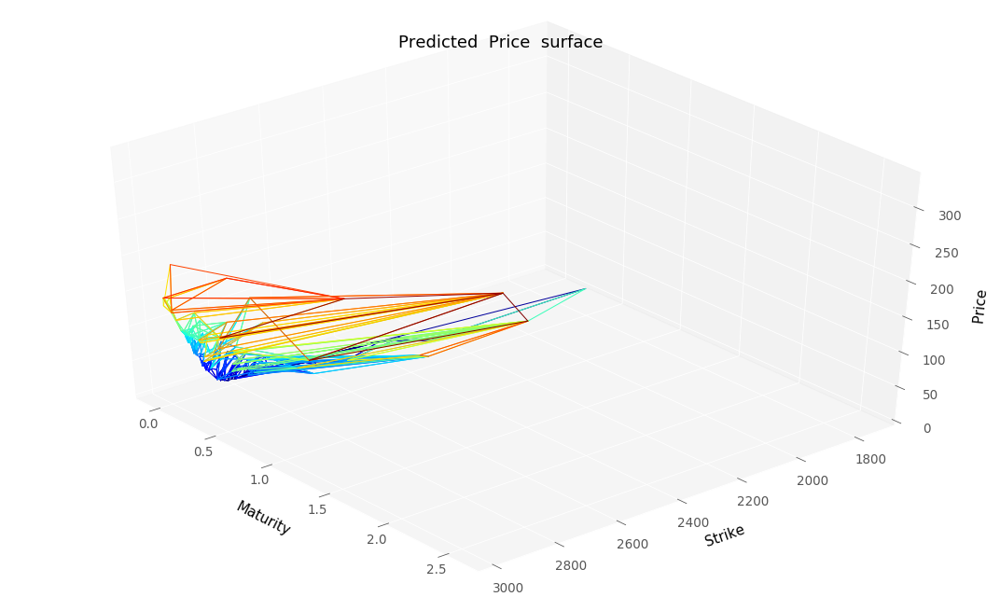

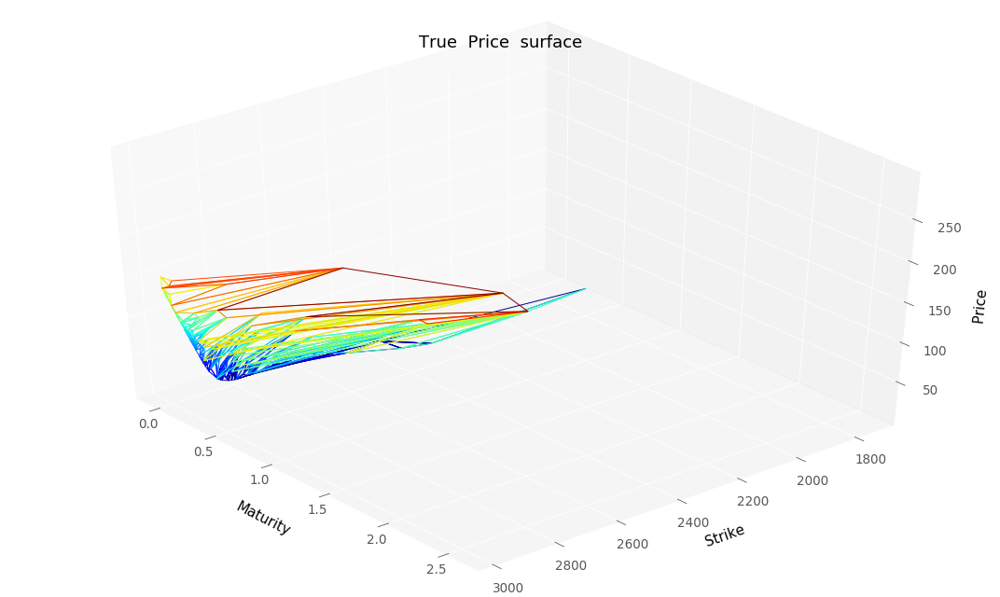

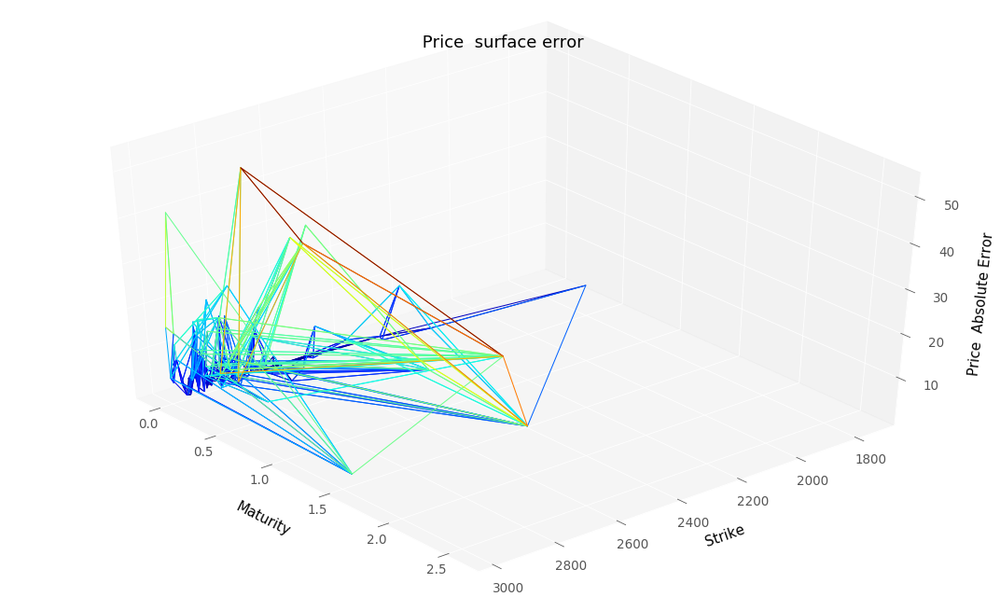

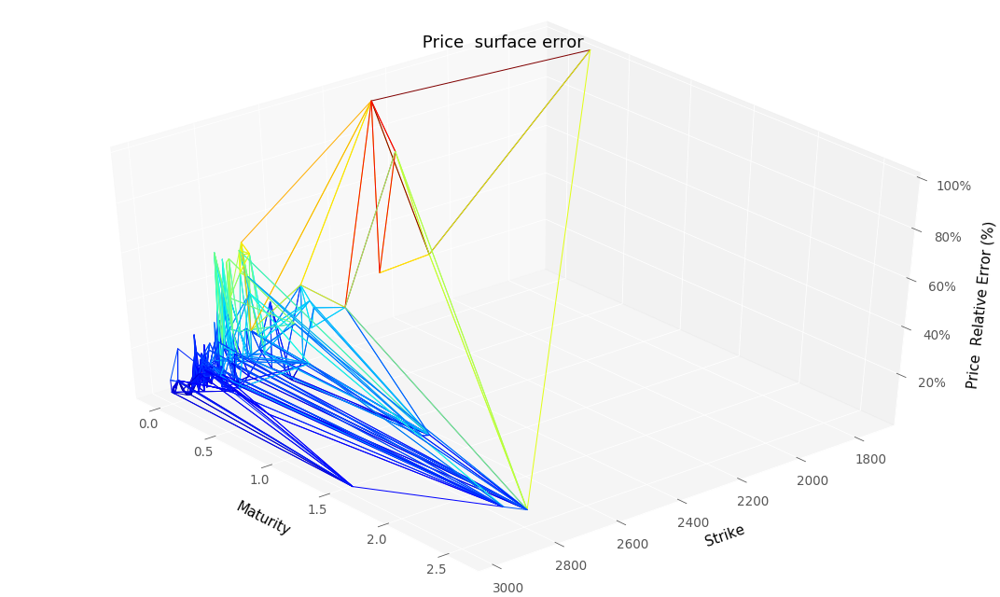

RMSE :  12.511250861913128
RMSE Relative:  0.25759777787761184


In [52]:
plotTools.predictionDiagnosis(mcResSSVITest["Price"], 
                              dataSetTest["Price"], 
                              " Price ", 
                              yMin=KMin,
                              yMax=KMax)

In [53]:
mcResSSVITest2 = backtest.MonteCarloPricerVectorized(S0,
                                                     dataSetTest,
                                                     bootstrap,
                                                     nbPaths,
                                                     nbTimeStep,
                                                     nnSSVI2)
mcResSSVITest2.head()

KeyboardInterrupt: 

In [ ]:
plotTools.predictionDiagnosis(mcResSSVITest2["Price"], 
                              dataSetTest["Price"], 
                              " Price ", 
                              yMin=KMin,
                              yMax=KMax)

In [ ]:
mcResSSVITest2.to_csv(workingFolder + "mcResSSVITest2.csv")

plotTools.plotSerie(testingDataSetSSVI[testingDataSetSSVI.index.get_level_values("Maturity") > 0.01],
                    Title = 'SSVI Local Volatility Surface',
                    az=30,
                    yMin=0.0*S0,
                    yMax=2.0*S0, 
                    zAsPercent=True)

In [ ]:
pdeResSigmaSSVITest = backtest.PDEPricerVectorized(dataSetTest, S0, nnSSVI, bootstrap)
pdeResSigmaSSVITest.head()

In [ ]:
plotTools.predictionDiagnosis(pdeResSigmaSSVITest, 
                              dataSetTest["Price"], 
                              " Price ", 
                              yMin=KMin,
                              yMax=KMax)

In [ ]:
pdeResSigmaSSVITest.to_csv(workingFolder + "pdeResSigmaSSVITest.csv")

In [ ]:
pdeResSigmaSSVITest2 = backtest.PDEPricerVectorized(dataSetTest, S0, nnSSVI2, bootstrap)
pdeResSigmaSSVITest2.head()

In [ ]:
plotTools.predictionDiagnosis(pdeResSigmaSSVITest2, 
                              dataSetTest["Price"], 
                              " Price ", 
                              yMin=KMin,
                              yMax=KMax)

In [ ]:
pdeResSigmaSSVITest2.to_csv(workingFolder + "pdeResSigmaSSVITest2.csv")